# 0 Setup

In [1]:
# Importing necessary libraries (could be necessary to install them first)
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import warnings
import matplotlib.pyplot as plt
import lightgbm as lgb
from plotly.subplots import make_subplots
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_log_error

# Remove FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Loading data and parsing dates
train_df = pd.read_csv('Data/train.csv', parse_dates=['date'])
test_df = pd.read_csv('Data/test.csv', parse_dates=['date'])
stores_df = pd.read_csv('Data/stores.csv')
holidays_events_df = pd.read_csv('Data/holidays_events.csv', parse_dates=['date'])
oil_df = pd.read_csv('Data/oil.csv', parse_dates=['date'])
transactions_df = pd.read_csv('Data/transactions.csv', parse_dates=['date'])

In [3]:
colors = px.colors.qualitative.Plotly
# Function to plot barplot
def barplot(df, x_col, y_col, title, xlabel, ylabel, color_col, yaxis_range=None, xaxis_tickangle=None, width=1000, height=400):
    fig = px.bar(df, x=x_col, y=y_col, color=color_col, title=title, labels={x_col: xlabel, y_col: ylabel})
    fig.update_layout(coloraxis_colorbar=dict(title=color_col), width=width, height=height, title_x=0.09, title_y=0.92, margin=dict(l=90, r=80, t=80, b=70), legend=dict(x=0.74, y=1))
    if yaxis_range is not None:
        fig.update_yaxes(range=yaxis_range)
    if xaxis_tickangle is not None:
        fig.update_xaxes(tickangle=xaxis_tickangle)
    fig.show()

# 1 Data Inspection and Preparation

### Defining Function for Data Inspection

In [4]:
# Function to extract the column information of a dataframe
def print_column_info(df):
    for column in df.columns:
        unique_count = df[column].nunique()
        unique_values = df[column].unique()
        missing_count = df[column].isnull().sum()

        print(f"Column: {column}")
        print(f"- Datatype: {df[column].dtype}")
        print(f"- Missing values: {missing_count}")
        print(f"- Number of unique values: {unique_count}")

        if unique_count <= 50:
            print(f"- Unique values: {unique_values}")
        else:
            min_value = df[column].min()
            max_value = df[column].max()
            print(f"- Minimum value: {min_value}")
            print(f"- Maximum value: {max_value}")
        print()

We defined 3 different time periods:
- date_range_train: Period for which training data was documented
- date_range_test: Period for which sales should be predicted
- date_range_total: Total time period (date_range_train + date_range_test)

## 1.1 train_df

### Inspection of train_df

In [5]:
# Display and information of train_df
print_column_info(train_df)
train_df

Column: id
- Datatype: int64
- Missing values: 0
- Number of unique values: 3000888
- Minimum value: 0
- Maximum value: 3000887

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1684
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-15 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']

Column: sales


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [6]:
# Creating a date range for the training data set
date_range_train = pd.date_range(start=train_df['date'].min(), end=train_df['date'].max())
print(f"Number of days in date_range_train: {len(date_range_train)}")

Number of days in date_range_train: 1688


*Period:*
- Period from 2013-01-01 to 2017-08-15 &rarr; date_range_train = 1688 days
- Only 1684 unique values in column 'date' &rarr; 4 days not documented

*Stores:*
- 54 unique values in column 'store_nbr' &rarr; 54 different stores

*Families:*
- 33 unique values in column 'family' &rarr; 33 different product families

*3000888 rows:*
- 1684 (documented days) * 54 (stores) * 33 (product families) = 3000888 rows
- For each unique date there are 1782 rows (54 * 33)

*Missing values:*
- None

In [7]:
# Identifying missing dates
missing_days_train = date_range_train.difference(train_df['date'])

print(f"Number of all days in period: {len(date_range_train)}")
print(f"Number of days documented: {len(train_df['date'].unique())}")
print(f"Number of missing days: {len(missing_days_train)}")
print("Missing dates:")
print(missing_days_train)

Number of all days in period: 1688
Number of days documented: 1684
Number of missing days: 4
Missing dates:
DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


&rarr; The 4 not documented days are always on 25 December (Christmas)

In [8]:
# Check whether missing dates exist in holidays_events_df
missing_days_train_in_holidays = holidays_events_df[holidays_events_df['date'].isin(missing_days_train)]

print("Missing dates contained in holidays_events_df:")
print(missing_days_train_in_holidays)

Missing dates contained in holidays_events_df:
          date     type    locale locale_name description  transferred
89  2013-12-25  Holiday  National     Ecuador     Navidad        False
155 2014-12-25  Holiday  National     Ecuador     Navidad        False
208 2015-12-25  Holiday  National     Ecuador     Navidad        False
294 2016-12-25  Holiday  National     Ecuador     Navidad        False


&rarr; This means that Christmas (Navidad) is the only day on which all stores are closed

&rarr; For completeness and consistency, we create additional rows for the 4 missing days and insert 0 values in the 'sales' and 'onpromotion' columns

### Creation of train_df_full

In [9]:
# Creation of a complete train dataframe

# Removing `id` column
train_df.drop(columns=['id'], inplace=True)

# Adding missing days
new_rows = []
for date in missing_days_train:
    for store in train_df['store_nbr'].unique():
        for family in train_df['family'].unique():
            new_rows.append({'date': date, 'store_nbr': store, 'family': family, 'sales': 0, 'onpromotion': 0})
new_rows_df = pd.DataFrame(new_rows)

# Creation of train_df_full
train_df_full = pd.concat([train_df, new_rows_df], ignore_index=True)
train_df_full.sort_values(by=['date', 'store_nbr', 'family'], inplace=True)

In [10]:
# Check if completion worked and if there are still missing days
missing_days_train_full = date_range_train.difference(train_df_full['date'].unique())
print(f"Number of missing days: {len(missing_days_train_full)}")
train_df_full[train_df_full['date'] == '2013-12-25']

Number of missing days: 0


,date,store_nbr,family,sales,onpromotion
3000888,2013-12-25,1,AUTOMOTIVE,0.0,0
3000889,2013-12-25,1,BABY CARE,0.0,0
3000890,2013-12-25,1,BEAUTY,0.0,0
3000891,2013-12-25,1,BEVERAGES,0.0,0
3000892,2013-12-25,1,BOOKS,0.0,0
...,...,...,...,...,...
3002533,2013-12-25,54,POULTRY,0.0,0
3002534,2013-12-25,54,PREPARED FOODS,0.0,0
3002535,2013-12-25,54,PRODUCE,0.0,0
3002536,2013-12-25,54,SCHOOL AND OFFICE SUPPLIES,0.0,0


In [11]:
# Saving complete training set as CSV (optional)
# train_df_full.to_csv('Data/Full_DataFrames/train_full.csv', index=False)

## 1.2 test_df

### Inspection of test_df

In [12]:
# Display and information of test_df
print_column_info(test_df)
test_df

Column: id
- Datatype: int64
- Missing values: 0
- Number of unique values: 28512
- Minimum value: 3000888
- Maximum value: 3029399

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 16
- Unique values: <DatetimeArray>
['2017-08-16 00:00:00', '2017-08-17 00:00:00', '2017-08-18 00:00:00',
 '2017-08-19 00:00:00', '2017-08-20 00:00:00', '2017-08-21 00:00:00',
 '2017-08-22 00:00:00', '2017-08-23 00:00:00', '2017-08-24 00:00:00',
 '2017-08-25 00:00:00', '2017-08-26 00:00:00', '2017-08-27 00:00:00',
 '2017-08-28 00:00:00', '2017-08-29 00:00:00', '2017-08-30 00:00:00',
 '2017-08-31 00:00:00']
Length: 16, dtype: datetime64[ns]

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DEL

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [13]:
# Creating date range for test data set
date_range_test = pd.date_range(start=test_df['date'].min(), end=test_df['date'].max())
print(f"Number of days in date_range_test: {len(date_range_test)}")

Number of days in date_range_test: 16


*Period:*
- Period from 2017-08-16 to 2017-08-31 &rarr; date_range_test = 16 days
- 16 unique values in column 'date' &rarr; All days contained in df

*28512 rows:*
- 1782 (all combinations of store and product family) * 16 (days to be predicted) = 28512 rows

*Missing values:*
- None

In [14]:
# Removing `id` column
test_df.drop(columns=['id'], inplace=True)

In [15]:
# Saving complete test set as CSV (optional)
# test_df.to_csv('Data/Full_DataFrames/test_full.csv', index=False)

## 1.3 stores_df

### Inspection of stores_df

In [16]:
# Display and information of stores_df
print_column_info(stores_df)
stores_df.head()

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: city
- Datatype: object
- Missing values: 0
- Number of unique values: 22
- Unique values: ['Quito' 'Santo Domingo' 'Cayambe' 'Latacunga' 'Riobamba' 'Ibarra'
 'Guaranda' 'Puyo' 'Ambato' 'Guayaquil' 'Salinas' 'Daule' 'Babahoyo'
 'Quevedo' 'Playas' 'Libertad' 'Cuenca' 'Loja' 'Machala' 'Esmeraldas'
 'Manta' 'El Carmen']

Column: state
- Datatype: object
- Missing values: 0
- Number of unique values: 16
- Unique values: ['Pichincha' 'Santo Domingo de los Tsachilas' 'Cotopaxi' 'Chimborazo'
 'Imbabura' 'Bolivar' 'Pastaza' 'Tungurahua' 'Guayas' 'Santa Elena'
 'Los Rios' 'Azuay' 'Loja' 'El Oro' 'Esmeraldas' 'Manabi']

Column: type
- Datatype: object
- Missing values: 0
- Number of unique values: 5
- Unique values: ['D' 'B' 'C' 'E' 'A']

Column: cluster
- Datatype: int64
- Missing values: 0
- Number of unique values: 17
- Unique values: [13  8  9  4  6 15  7  3 1

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


*Stores:*
- 54 different stores (1 to 54)
- Stores are located in 22 different cities
- Stores are located in 16 different states
- There are 17 different clusters (1 to 17)
- There are 5 different types (A to E)

*54 rows:*
- One row per store

*Missing values:*
- None

## 1.4 oil_df

### Inspection of oil_df

In [17]:
# Display and information of oil_df
print_column_info(oil_df)
oil_df

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1218
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: dcoilwtico
- Datatype: float64
- Missing values: 43
- Number of unique values: 998
- Minimum value: 26.19
- Maximum value: 110.62



,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


&rarr; Date of first row is 2013-01-01 and date of last row is 2017-08-31, meaning that oil price data is available for the entire period

In [18]:
# Creating date range for entire period
date_range_total = pd.date_range(start=oil_df['date'].min(), end=oil_df['date'].max())
print(f"Number of days in date_range_total: {len(date_range_total)}")

Number of days in date_range_total: 1704


*Period:*
- Period from 2013-01-01 to 2017-08-31 &rarr; date_range_total = 1704 days
- Only 1218 unique values in column 'date' &rarr; 486 days not documented

*Missing values:*
- 43 in column 'dcoilwtico'

In [19]:
# Identifying missing dates
missing_days_oil = date_range_total.difference(oil_df['date'])

print(f"Number of all days in period: {len(date_range_total)}")
print(f"Number of days documented: {len(oil_df['date'].unique())}")
print(f"Number of missing days: {len(missing_days_oil)}")
print("Missing dates:")
print(missing_days_oil)

Number of all days in period: 1704
Number of days documented: 1218
Number of missing days: 486
Missing dates:
DatetimeIndex(['2013-01-05', '2013-01-06', '2013-01-12', '2013-01-13',
               '2013-01-19', '2013-01-20', '2013-01-26', '2013-01-27',
               '2013-02-02', '2013-02-03',
               ...
               '2017-07-29', '2017-07-30', '2017-08-05', '2017-08-06',
               '2017-08-12', '2017-08-13', '2017-08-19', '2017-08-20',
               '2017-08-26', '2017-08-27'],
              dtype='datetime64[ns]', length=486, freq=None)


&rarr; With the missing date values, it is noticeable that there are always 2 days missing in succession &rarr; Most likely weekends

In [20]:
# Check whether the missing days fall on weekends
weekend_days = date_range_total[date_range_total.weekday >= 5]
print(f"Number of weekend days: {len(weekend_days)}")

Number of weekend days: 486


*486 missing days in data set:*

&rarr; Days not included are weekends

*43 missing values in column 'dcoilwtico'*
- 'dcoilwtico' is traded on the American stock exchange

&rarr; 43 missing values could be due to public holidays (googling confirms this thesis)

&rarr; For completeness and consistency, we insert the missing days and then deal with the missing values

### Creation of oil_df_full

In [21]:
# Creation of a complete oil dataframe
full_date_range_oil = pd.DataFrame(date_range_total, columns=['date'])
oil_df_full = full_date_range_oil.merge(oil_df, on='date', how='left')

# Creation of a copy with missing values for visualisation
oil_df_full_missing = oil_df_full.copy()

In [22]:
# Check if completion worked and if there are still missing days
missing_days_oil_full = date_range_total.difference(oil_df_full['date'].unique())
print(f"Number of missing days: {len(missing_days_oil_full)}")
print(f"Number of missing values: {oil_df_full['dcoilwtico'].isnull().sum()}")

Number of missing days: 0
Number of missing values: 529


*529 missing values:*
- 43 missing values due to American public holidays (were already missing before)
- 486 missing values due to weekends (missing because we added rows for weekend days)

*Handling missing values:*
- Usually, it is common for exchanges to use the last available price as a benchmark
- However, since we know the prices on the following days we want to mimic the natural course of oil price fluctuations

&rarr; Interpolation

In [23]:
# Interpolation of missing values in the oil price data set
oil_df_full['dcoilwtico'] = oil_df_full['dcoilwtico'].interpolate()

# Check whether there are still missing values and fill with ffill/bfill if necessary
oil_df_full['dcoilwtico'] = oil_df_full['dcoilwtico'].ffill()
oil_df_full['dcoilwtico'] = oil_df_full['dcoilwtico'].bfill()

# Check whether all missing values have been replaced
print(f"Number of missing values: {oil_df_full['dcoilwtico'].isnull().sum()}")

Number of missing values: 0


In [24]:
# Cross-plotting oil price over time to review interpolation with Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=oil_df_full['date'], y=oil_df_full['dcoilwtico'], mode='lines', name='Interpolated Oil Price', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=oil_df_full_missing['date'], y=oil_df_full_missing['dcoilwtico'], mode='lines', name='Oil Price with Missing Values', line=dict(color='red')))
fig.update_layout(title='Interpolated Oil Price over Time', xaxis_title='Date', yaxis_title='Oil Price', height=500, width=1000, title_x=0.09, title_y=0.92)
fig.update_layout(margin=dict(l=90, r=80, t=80, b=80), legend=dict(x=0.74, y=1))
fig.show()

In [25]:
# Saving complete oil data set as CSV (optional)
# oil_df_full.to_csv('Data/Full_DataFrames/oil_full.csv', index=False)

## 1.5 holidays_events_df

### Inspection of holidays_events_df

In [26]:
# Display and information of holidays_events_df
print_column_info(holidays_events_df)
holidays_events_df

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 312
- Minimum value: 2012-03-02 00:00:00
- Maximum value: 2017-12-26 00:00:00

Column: type
- Datatype: object
- Missing values: 0
- Number of unique values: 6
- Unique values: ['Holiday' 'Transfer' 'Additional' 'Bridge' 'Work Day' 'Event']

Column: locale
- Datatype: object
- Missing values: 0
- Number of unique values: 3
- Unique values: ['Local' 'Regional' 'National']

Column: locale_name
- Datatype: object
- Missing values: 0
- Number of unique values: 24
- Unique values: ['Manta' 'Cotopaxi' 'Cuenca' 'Libertad' 'Riobamba' 'Puyo' 'Guaranda'
 'Imbabura' 'Latacunga' 'Machala' 'Santo Domingo' 'El Carmen' 'Cayambe'
 'Esmeraldas' 'Ecuador' 'Ambato' 'Ibarra' 'Quevedo'
 'Santo Domingo de los Tsachilas' 'Santa Elena' 'Quito' 'Loja' 'Salinas'
 'Guayaquil']

Column: description
- Datatype: object
- Missing values: 0
- Number of unique values: 103
- Minimum value: Batalla de Pichincha
- Maximum value: Vierne

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


*Period:*
- Period from 2012-03-02 to 2017-12-26 &rarr; Exceeds date_range_total &rarr; Keep only rows within date_range_total
- Only 312 unique values in column 'date' &rarr; Normal days not included

*Type:*
- Holiday: Public holiday &rarr; Keep
- Transfer: Day to which a public holiday has been moved where there actually would not have been one &rarr; Change type to Holiday for simplification
- Additional: Additional public holiday that does not occur every year &rarr; Replace type to Holiday for simplification
- Bridge: Bridge day &rarr; Replace type to Holiday for simplification
- Work Day: Day that would have actually been off (like a Saturday), but has been declared a working day due to a bridge day &rarr; Delete rows for simplification
- Event: Day that is not a public holiday, but where an event has taken place &rarr; Keep

&rarr; Delete rows that have the value True in column 'transferred' as these days were not public holidays and delete column 'transferred'

*Locale:*
- Local: Holiday at city level
- Regional: Holiday at state level
- National: Holiday at country level

*Locale_name:*
- Scope of holiday or event, depending on value in column 'locale'
- Inconsistency within the column, as the column sometimes contains the name of a city (in the case of 'Local'), the name of a state (in the case of 'Regional') and the name of the country (in the case of 'National'), which can lead to difficulties later on

&rarr; Creation of a new dataframe with all combinations of days within the date_range_total and stores to specifically define type of each day for each store 

*350 rows:*
- 350 rows, but only 312 unique values in column 'date' &rarr; Some holidays were listed multiple times, e.g. if they have multiple scopes

*Missing values:*
- None

In [27]:
# Executing previously mentioned modifications
holidays_events_df = holidays_events_df[holidays_events_df['date'].isin(date_range_total)]
holidays_events_df = holidays_events_df[holidays_events_df['transferred'] == False]
holidays_events_df.loc[holidays_events_df['type'] == 'Transfer', 'type'] = 'Holiday'
holidays_events_df = holidays_events_df.drop('transferred', axis=1)
holidays_events_df.loc[holidays_events_df['type'] == 'Additional', 'type'] = 'Holiday'
holidays_events_df.loc[holidays_events_df['type'] == 'Bridge', 'type'] = 'Holiday'
holidays_events_df = holidays_events_df[holidays_events_df['type'] != 'Work Day']
print(holidays_events_df.nunique())
holidays_events_df

date           244
type             2
locale           3
locale_name     24
description     97
dtype: int64


,date,type,locale,locale_name,description
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano
44,2013-02-11,Holiday,National,Ecuador,Carnaval
45,2013-02-12,Holiday,National,Ecuador,Carnaval
46,2013-03-02,Holiday,Local,Manta,Fundacion de Manta
47,2013-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi
...,...,...,...,...,...
322,2017-07-25,Holiday,Local,Guayaquil,Fundacion de Guayaquil
323,2017-08-05,Holiday,Local,Esmeraldas,Fundacion de Esmeraldas
325,2017-08-11,Holiday,National,Ecuador,Traslado Primer Grito de Independencia
326,2017-08-15,Holiday,Local,Riobamba,Fundacion de Riobamba


&rarr; Now we only have the 2 types 'Holiday' and 'Event'

&rarr; We split the holidays_events_df into 2 separate dataframes to better differentiate between holidays and non-holidays

### Separating Dataframe in Holidays and Events

In [28]:
# Split holidays_events_df by type
holidays_df = holidays_events_df[holidays_events_df['type'] == 'Holiday']
events_df = holidays_events_df[holidays_events_df['type'] == 'Event']

print(holidays_df.nunique())
print(holidays_df.shape)
print(events_df.nunique())
print(events_df.shape)

date           195
type             1
locale           3
locale_name     24
description     54
dtype: int64
(217, 5)
date           55
type            1
locale          1
locale_name     1
description    43
dtype: int64
(56, 5)


#### 1. events_df

In [29]:
# Display and information of events_df
print_column_info(events_df)
print(events_df.shape)
events_df.head()

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 55
- Minimum value: 2013-05-12 00:00:00
- Maximum value: 2017-05-14 00:00:00

Column: type
- Datatype: object
- Missing values: 0
- Number of unique values: 1
- Unique values: ['Event']

Column: locale
- Datatype: object
- Missing values: 0
- Number of unique values: 1
- Unique values: ['National']

Column: locale_name
- Datatype: object
- Missing values: 0
- Number of unique values: 1
- Unique values: ['Ecuador']

Column: description
- Datatype: object
- Missing values: 0
- Number of unique values: 43
- Unique values: ['Dia de la Madre' 'Inauguracion Mundial de futbol Brasil'
 'Mundial de futbol Brasil: Ecuador-Suiza'
 'Mundial de futbol Brasil: Ecuador-Honduras'
 'Mundial de futbol Brasil: Ecuador-Francia'
 'Mundial de futbol Brasil: Octavos de Final'
 'Mundial de futbol Brasil: Cuartos de Final'
 'Mundial de futbol Brasil: Semifinales'
 'Mundial de futbol Brasil: Tercer y cuarto lugar'
 'Mundial d

,date,type,locale,locale_name,description
55,2013-05-12,Event,National,Ecuador,Dia de la Madre
103,2014-05-11,Event,National,Ecuador,Dia de la Madre
106,2014-06-12,Event,National,Ecuador,Inauguracion Mundial de futbol Brasil
107,2014-06-15,Event,National,Ecuador,Mundial de futbol Brasil: Ecuador-Suiza
108,2014-06-20,Event,National,Ecuador,Mundial de futbol Brasil: Ecuador-Honduras


*Locale:*
- There is only one unique value 'National', which means that all events are at national level (i.e. for each store)

*56 rows:*
- 56 rows but only 55 unique values in column 'date' &rarr; One day is listed twice 

&rarr; As this can lead to overlaps in the assignment later, we check the rows of this day

In [30]:
# Check for duplicated dates
events_df[events_df['date'].duplicated(keep=False)]

,date,type,locale,locale_name,description
244,2016-05-08,Event,National,Ecuador,Terremoto Manabi+22
245,2016-05-08,Event,National,Ecuador,Dia de la Madre


- The entire next month after the earthquake on 16 April 2016 has been classified as an event
- The event 'Mother's Day' is recorded on the same day
- If there is an anomaly in the sales volume on 8 May 2016, it is more likely that this is due to Mother's Day

&rarr; Decision to remove the one line with the description 'Terremoto Manabi+22'

In [31]:
# Drop row 244 and check for duplikates again
events_df = events_df.drop(244)
events_df[events_df['date'].duplicated(keep=False)]

,date,type,locale,locale_name,description


In [32]:
# Count numbers of occurrences for all unique values in column 'description'
events_df['description'].value_counts()

description
Dia de la Madre                                    5
Mundial de futbol Brasil: Octavos de Final         4
Black Friday                                       3
Cyber Monday                                       3
Mundial de futbol Brasil: Cuartos de Final         2
Mundial de futbol Brasil: Semifinales              2
Terremoto Manabi+27                                1
Terremoto Manabi+20                                1
Terremoto Manabi+14                                1
Terremoto Manabi+15                                1
Terremoto Manabi+16                                1
Terremoto Manabi+17                                1
Terremoto Manabi+18                                1
Terremoto Manabi+19                                1
Terremoto Manabi+23                                1
Terremoto Manabi+21                                1
Terremoto Manabi+28                                1
Terremoto Manabi+24                                1
Terremoto Manabi+12               

&rarr; To investigate impact of different types of events it helps to aggregate similar events

&rarr; We have 5 different types of events:
- Mother's Day (Dia de la Madre)
- Football World Cup (Mundial de futbol)
- Sales days (Black Friday, Cyber Monday)
- Earthquake (Terremoto Manabi)
- Days following the earthquake (Terremoto Manabi +1 to +30)

In [33]:
# Transformation of the description column
def transform_description(description):
    if description == 'Dia de la Madre':
        return 'Dia de la Madre'
    elif description == 'Cyber Monday':
        return 'Cyber Monday'
    elif description == 'Black Friday':
        return 'Black Friday'
    elif 'Mundial de futbol' in description:
        return 'Mundial de futbol'
    elif description == 'Terremoto Manabi':
        return 'Terremoto Manabi'
    elif 'Terremoto Manabi+' in description:
        days = int(description.split('+')[1])
        if days <= 7:
            return 'Terremoto Manabi 1W'
        elif days <= 14:
            return 'Terremoto Manabi 2W'
        elif days <= 21:
            return 'Terremoto Manabi 3W'
        else:
            return 'Terremoto Manabi 4W+'
    else:
        return description

events_df.loc[:, 'description'] = events_df['description'].apply(transform_description)
events_df['description'].value_counts()

description
Mundial de futbol       14
Terremoto Manabi 4W+     8
Terremoto Manabi 1W      7
Terremoto Manabi 2W      7
Terremoto Manabi 3W      7
Dia de la Madre          5
Black Friday             3
Cyber Monday             3
Terremoto Manabi         1
Name: count, dtype: int64

In [34]:
# Display and information
print(events_df.nunique())
print(events_df.shape)
events_df.tail()

date           55
type            1
locale          1
locale_name     1
description     9
dtype: int64
(55, 5)


,date,type,locale,locale_name,description
253,2016-05-15,Event,National,Ecuador,Terremoto Manabi 4W+
254,2016-05-16,Event,National,Ecuador,Terremoto Manabi 4W+
284,2016-11-25,Event,National,Ecuador,Black Friday
285,2016-11-28,Event,National,Ecuador,Cyber Monday
311,2017-05-14,Event,National,Ecuador,Dia de la Madre


#### 2. holidays_df

In [35]:
# Display and information of holidays_df
print_column_info(holidays_df)
print(holidays_df.shape)
holidays_df.head()

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 195
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-24 00:00:00

Column: type
- Datatype: object
- Missing values: 0
- Number of unique values: 1
- Unique values: ['Holiday']

Column: locale
- Datatype: object
- Missing values: 0
- Number of unique values: 3
- Unique values: ['National' 'Local' 'Regional']

Column: locale_name
- Datatype: object
- Missing values: 0
- Number of unique values: 24
- Unique values: ['Ecuador' 'Manta' 'Cotopaxi' 'Cuenca' 'Libertad' 'Riobamba' 'Puyo'
 'Guaranda' 'Imbabura' 'Machala' 'Latacunga' 'El Carmen' 'Santo Domingo'
 'Cayambe' 'Guayaquil' 'Esmeraldas' 'Ambato' 'Ibarra' 'Quevedo'
 'Santo Domingo de los Tsachilas' 'Santa Elena' 'Quito' 'Loja' 'Salinas']

Column: description
- Datatype: object
- Missing values: 0
- Number of unique values: 54
- Minimum value: Batalla de Pichincha
- Maximum value: Viernes Santo

(217, 5)


,date,type,locale,locale_name,description
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano
44,2013-02-11,Holiday,National,Ecuador,Carnaval
45,2013-02-12,Holiday,National,Ecuador,Carnaval
46,2013-03-02,Holiday,Local,Manta,Fundacion de Manta
47,2013-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi


*217 rows:*
- 217 rows, but only 195 unique values in column 'date' &rarr; A few days are listed multiple times

In [36]:
# Display rows that contain duplicates in the 'date', 'locale' and 'locale_name' columns
holidays_df[holidays_df.duplicated(subset=['date', 'locale', 'locale_name'], keep=False)]

,date,type,locale,locale_name,description
156,2014-12-26,Holiday,National,Ecuador,Puente Navidad
157,2014-12-26,Holiday,National,Ecuador,Navidad+1
264,2016-07-24,Holiday,Local,Guayaquil,Fundacion de Guayaquil-1
265,2016-07-24,Holiday,Local,Guayaquil,Traslado Fundacion de Guayaquil


&rarr; These rows represent direct overlaps, as they contain both the same date and the same scope 

In [37]:
# Deleting rows 156 and 264 to remove duplicates
holidays_df = holidays_df.drop([156, 264])
holidays_df[holidays_df.duplicated(subset=['date', 'locale', 'locale_name'], keep=False)]

,date,type,locale,locale_name,description


In [38]:
# Display potential overlaps
national_dates = holidays_df[holidays_df['locale'] == 'National']['date'].unique()
potential_conflict_rows = holidays_df[holidays_df['date'].isin(national_dates)]
duplicate_dates = potential_conflict_rows[potential_conflict_rows['date'].duplicated(keep=False)]
duplicate_dates

,date,type,locale,locale_name,description
85,2013-12-22,Holiday,National,Ecuador,Navidad-3
86,2013-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas
151,2014-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas
152,2014-12-22,Holiday,National,Ecuador,Navidad-3
204,2015-12-22,Holiday,National,Ecuador,Navidad-3
205,2015-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas
290,2016-12-22,Holiday,National,Ecuador,Navidad-3
291,2016-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas
305,2017-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad
306,2017-04-14,Holiday,National,Ecuador,Viernes Santo


&rarr; These rows represent indirect overlaps
- 'National' public holidays apply to all 54 stores
- If the date of a 'National' holiday occurs again as a 'Local' holiday, it would lead to overlaps for the stores in that region

In [39]:
# For simplicity, deleting the duplicate rows with locale 'local'
holidays_df = holidays_df.drop(duplicate_dates[duplicate_dates['locale'] == 'Local'].index)
holidays_df[holidays_df['date'] == '2013-12-22']

,date,type,locale,locale_name,description
85,2013-12-22,Holiday,National,Ecuador,Navidad-3


In [40]:
# Count numbers of occurrences for all unique values in column 'description'
holidays_df['description'].value_counts()

description
Carnaval                                  10
Cantonizacion de El Carmen                 5
Cantonizacion del Puyo                     5
Fundacion de Esmeraldas                    5
Cantonizacion de Cayambe                   5
Fundacion de Santo Domingo                 5
Cantonizacion de Latacunga                 5
Fundacion de Machala                       5
Provincializacion de Imbabura              5
Fundacion de Ambato                        5
Cantonizacion de Guaranda                  5
Dia de la Madre-1                          5
Dia del Trabajo                            5
Viernes Santo                              5
Cantonizacion de Riobamba                  5
Fundacion de Cuenca                        5
Provincializacion de Cotopaxi              5
Fundacion de Manta                         5
Fundacion de Riobamba                      5
Fundacion de Quito                         4
Fundacion de Loja                          4
Fundacion de Quito-1                       

In [41]:
# Transformation of the description column
def transform_holiday_description(description):
    if description == 'Carnaval':
        return 'Carnaval'
    elif description == 'Dia del Trabajo':
        return 'Dia del Trabajo'
    elif description == 'Viernes Santo':
        return 'Viernes Santo'
    elif description == 'Navidad':
        return 'Navidad'
    elif 'Navidad-' in description:
        return 'Pre Navidad'
    elif 'Navidad+' in description:
        return 'Post Navidad'
    elif 'Primer dia del ano' in description:
        return 'Primer dia del ano'
    elif description == 'Dia de Difuntos' or description == 'Puente Dia de Difuntos':
        return 'Dia de Difuntos'
    elif description in ['Primer Grito de Independencia', 'Batalla de Pichincha', 'Independencia de Guayaquil', 'Traslado Primer Grito de Independencia', 'Traslado Batalla de Pichincha', 'Traslado Independencia de Guayaquil', 'Independencia de Cuenca', 'Independencia de Guaranda', 'Independencia de Latacunga', 'Independencia de Ambato']:
        return 'Independence'
    elif 'Cantonizacion' in description or 'Fundacion' in description or 'Provincializacion' in description or description == 'Traslado Fundacion de Guayaquil':
        return 'Regional Celebrations'
    elif description == 'Dia de la Madre-1':
        return 'Dia de la Madre-1'
    else:
        return description

holidays_df.loc[:, 'description'] = holidays_df['description'].apply(transform_holiday_description)
holidays_df['description'].value_counts()

description
Regional Celebrations    116
Independence              30
Pre Navidad               16
Primer dia del ano        10
Carnaval                  10
Viernes Santo              5
Dia del Trabajo            5
Dia de la Madre-1          5
Dia de Difuntos            5
Navidad                    4
Post Navidad               4
Name: count, dtype: int64

In [42]:
# Display and information
print(holidays_df.nunique())
print(holidays_df.shape)
holidays_df.tail()

date           195
type             1
locale           3
locale_name     23
description     11
dtype: int64
(210, 5)


,date,type,locale,locale_name,description
322,2017-07-25,Holiday,Local,Guayaquil,Regional Celebrations
323,2017-08-05,Holiday,Local,Esmeraldas,Regional Celebrations
325,2017-08-11,Holiday,National,Ecuador,Independence
326,2017-08-15,Holiday,Local,Riobamba,Regional Celebrations
327,2017-08-24,Holiday,Local,Ambato,Regional Celebrations


### Creation of date_store_df

&rarr; Now we create a list with all combinations of date within date_range_total and store so we can define the type of day and event for each store
- We have 54 different stores 
- date_range_total covers 1704 days
- This means that the list must have 92016 rows

&rarr; We merge the following data sets:
- stores_df: Contains all information about the specific stores
- events_df: Contains all information on events and earthquakes
- holidays_df: Contains all information on public holidays

In [43]:
# Creation of a complete date-store dataframe
stores_df = stores_df.rename(columns={'type': 'store_type'})
date_store_combinations = pd.MultiIndex.from_product([date_range_total, stores_df['store_nbr']], names=['date', 'store_nbr']).to_frame(index=False)
date_store_df = date_store_combinations.merge(stores_df, on='store_nbr', how='left')

# Assign holidays
date_store_df['day_type'] = 'Regular'
date_store_df['day_description'] = 'Regular Day'
for index, row in holidays_df.iterrows():
    if row['locale'] == 'National':
        date_store_df.loc[date_store_df['date'] == row['date'], ['day_type', 'day_description']] = row['type'], row['description']
    elif row['locale'] == 'Regional':
        date_store_df.loc[(date_store_df['date'] == row['date']) & (date_store_df['state'] == row['locale_name']), ['day_type', 'day_description']] = row['type'], row['description']
    elif row['locale'] == 'Local':
        date_store_df.loc[(date_store_df['date'] == row['date']) & (date_store_df['city'] == row['locale_name']), ['day_type', 'day_description']] = row['type'], row['description']

# Assign events
date_store_df['event_type'] = 'Nothing'
date_store_df['event_description'] = 'No Event'
for index, row in events_df.iterrows():
    if row['locale'] == 'National':
        date_store_df.loc[date_store_df['date'] == row['date'], ['event_type', 'event_description']] = row['type'], row['description']

In [44]:
# Display and information of date_store_df
print_column_info(date_store_df)
date_store_df

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: city
- Datatype: object
- Missing values: 0
- Number of unique values: 22
- Unique values: ['Quito' 'Santo Domingo' 'Cayambe' 'Latacunga' 'Riobamba' 'Ibarra'
 'Guaranda' 'Puyo' 'Ambato' 'Guayaquil' 'Salinas' 'Daule' 'Babahoyo'
 'Quevedo' 'Playas' 'Libertad' 'Cuenca' 'Loja' 'Machala' 'Esmeraldas'
 'Manta' 'El Carmen']

Column: state
- Datatype: object
- Missing values: 0
- Number of unique values: 16
- Unique values: ['Pichincha' 'Santo Domingo de los Tsachilas' 'Cotopaxi' 'Chimborazo'
 'Imbabura' 'Bolivar' 'Pastaza' 'Tungurahua' 'Guayas' 'Santa Elena'
 'Los Rios' 'Azuay' 'Loja' 'El Oro' 'Esmeraldas' 'Manabi']

Column: store_type
- Datatype: object
- Missing values: 0
- Number of unique valu

,date,store_nbr,city,state,store_type,cluster,day_type,day_description,event_type,event_description
0,2013-01-01,1,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
1,2013-01-01,2,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
2,2013-01-01,3,Quito,Pichincha,D,8,Holiday,Primer dia del ano,Nothing,No Event
3,2013-01-01,4,Quito,Pichincha,D,9,Holiday,Primer dia del ano,Nothing,No Event
4,2013-01-01,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4,Holiday,Primer dia del ano,Nothing,No Event
...,...,...,...,...,...,...,...,...,...,...
92011,2017-08-31,50,Ambato,Tungurahua,A,14,Regular,Regular Day,Nothing,No Event
92012,2017-08-31,51,Guayaquil,Guayas,A,17,Regular,Regular Day,Nothing,No Event
92013,2017-08-31,52,Manta,Manabi,A,11,Regular,Regular Day,Nothing,No Event
92014,2017-08-31,53,Manta,Manabi,D,13,Regular,Regular Day,Nothing,No Event


*Period:*
- Period from 2013-01-01 to 2017-08-31 &rarr; date_range_train = 1704 days

*Day_type:*
&rarr; We now only have two types: 
- 'Regular': day that is not a public holiday
- 'Holiday': Day that is a public holiday

*Event_type:*
&rarr; Indicates whether there was an event on the day (and which one) or not
- Nothing: Normal day without a special event
- Event: Day that is not a public holiday but on which a special event took place
- Earthquake: Day on which there was an earthquake or the days afterwards

*92016 rows:*
- 1704 (days) * 54 (stores) = 92016

*Missing values:*
- None

In [45]:
# Saving complete date-store data set as CSV (optional)
# date_store_df.to_csv('Data/Full_DataFrames/date_store_full.csv', index=False)

## 1.6 transactions_df

### Inspection of transactions_df

In [46]:
# Display and information of transactions_df
print_column_info(transactions_df)
transactions_df

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1682
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-15 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: transactions
- Datatype: int64
- Missing values: 0
- Number of unique values: 4993
- Minimum value: 5
- Maximum value: 8359



,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


*Period:*
- Period from 2013-01-01 to 2017-08-15 &rarr; date_range_train = 1688 days
- But only 1682 unique values in the column 'date' &rarr; 6 days are not documented

*83488 rows:*
- A date does not always have the same number of rows, as DataFrame would otherwise have to have 1682 (documented days) * 54 (stores) = 90828 rows
- Since the lowest value in column 'transactions' is 5, we assume that every combination of date and store that does not appear in the list had 0 transactions on that day and therefore the store was closed on that day (we are still checking)

&rarr; We want to complete the df for consistency again with all combinations of date from date_range_train and store
- The complete df should therefore have 1688 (days from date_range_train) * 54 (stores) = 91152 rows
- Stores whose aggregated daily sales were 0 on one day therefore also have 0 transactions

*Missing values:*
- None

### Creation of transactions_df_full

In [47]:
# Creation of a complete transactions dataframe
transactions_df_full = pd.MultiIndex.from_product([date_range_train, stores_df['store_nbr']], names=['date', 'store_nbr']).to_frame(index=False)
transactions_df_full['transactions'] = None

for index, row in transactions_df.iterrows():
    transactions_df_full.loc[(transactions_df_full['date'] == row['date']) & (transactions_df_full['store_nbr'] == row['store_nbr']), 'transactions'] = row['transactions']

In [48]:
# Display and information of transactions_df_full
print_column_info(transactions_df_full)
transactions_df_full

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1688
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-15 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: transactions
- Datatype: object
- Missing values: 7664
- Number of unique values: 4993
- Minimum value: 5
- Maximum value: 8359



,date,store_nbr,transactions
0,2013-01-01,1,None
1,2013-01-01,2,None
2,2013-01-01,3,None
3,2013-01-01,4,None
4,2013-01-01,5,None
...,...,...,...
91147,2017-08-15,50,2804
91148,2017-08-15,51,1573
91149,2017-08-15,52,2255
91150,2017-08-15,53,932


- The original transactions_df had 83488 rows (combinations of date and store)
- The full transactions_df_full has 91152 rows (All combinations of date and store in date_range_train)

&rarr; 91152 - 83488 = 7664 missing values for which we need to check whether the corresponding stores were closed on the days or no transactions were documented

In [49]:
# Aggregate sales by date and store_nbr to check whether certain stores were open
sales_by_store = train_df_full.groupby(['date', 'store_nbr'])['sales'].sum().reset_index()

transaction_records = transactions_df_full[transactions_df_full['transactions'].notnull()]
no_transaction_records = transactions_df_full[transactions_df_full['transactions'].isnull()]
closed_stores = sales_by_store[sales_by_store['sales'] == 0]
open_stores = no_transaction_records[~no_transaction_records.set_index(['date', 'store_nbr']).index.isin(closed_stores.set_index(['date', 'store_nbr']).index)]

print(f"Number of all date and store combinations: {len(transactions_df_full)}")
print(f"Number of combinations for which transactions were documented: {len(transaction_records)}")
print(f"Number of combinations for which no transactions were documented: {len(no_transaction_records)}")
print(f"Number of combinations that were actually closed: {len(closed_stores)}")
print(f"Number of combinations that were opened and no transactions were mistakenly documented: {len(open_stores)}")

Number of all date and store combinations: 91152
Number of combinations for which transactions were documented: 83488
Number of combinations for which no transactions were documented: 7664
Number of combinations that were actually closed: 7546
Number of combinations that were opened and no transactions were mistakenly documented: 118


&rarr; Now we need to handle the 7664 missing values
- For the 7546 combinations of date and store where the stores were actually closed, we can enter a 0 in the 'transactions' column in transactions_df_full
- We fill in the other 118 combinations that were not documented by interpolation

In [50]:
# Handling missing values

# Fill missing values with 0 for closed stores
transactions_df_full.loc[transactions_df_full.set_index(['date', 'store_nbr']).index.isin(closed_stores.set_index(['date', 'store_nbr']).index), 'transactions'] = 0

# Interpolation of missing values for open stores
transactions_df_full = transactions_df_full.sort_values(by=['store_nbr', 'date'])
transactions_df_full['transactions'] = pd.to_numeric(transactions_df_full['transactions'], errors='coerce')
transactions_df_full['transactions'] = transactions_df_full.groupby('store_nbr')['transactions'].apply(lambda group: group.interpolate()).reset_index(level=0, drop=True)
transactions_df_full = transactions_df_full.sort_values(by=['date', 'store_nbr'])

In [51]:
# Display and information of transactions_df_full
print_column_info(transactions_df_full)
transactions_df_full

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1688
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-15 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: transactions
- Datatype: float64
- Missing values: 0
- Number of unique values: 5063
- Minimum value: 0.0
- Maximum value: 8359.0



,date,store_nbr,transactions
0,2013-01-01,1,0.0
1,2013-01-01,2,0.0
2,2013-01-01,3,0.0
3,2013-01-01,4,0.0
4,2013-01-01,5,0.0
...,...,...,...
91147,2017-08-15,50,2804.0
91148,2017-08-15,51,1573.0
91149,2017-08-15,52,2255.0
91150,2017-08-15,53,932.0


In [52]:
# Saving complete transactions data set as CSV (optional)
# transactions_df_full.to_csv('Data/Full_DataFrames/transactions_full.csv', index=False)

## 1.7 Additional Data

&rarr; After consideration, we realised that the weather might also have an impact on sales, as the stores are located in different regions
- We decided to include historical weather information at state level
- We downloaded various weather variables over the entire period from a weather API as a csv file

### Loading and Inspection of Weather Data

In [53]:
# Laden der Wetterdaten mit ; als Trennzeichen
states_coordinates_df = pd.read_csv('Data/states_coordinates_id.csv', delimiter=';')
weather_states_df = pd.read_csv('Data/weather_data_states_id.csv', delimiter=';', parse_dates=['time'])
states_coordinates_df = states_coordinates_df.rename(columns={'State': 'state'})
weather_states_df = weather_states_df.rename(columns={'time': 'date'})

In [54]:
# Display and information of states_coordinates_df
print_column_info(states_coordinates_df)
states_coordinates_df.head()

Column: location_id
- Datatype: int64
- Missing values: 0
- Number of unique values: 16
- Unique values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]

Column: latitude
- Datatype: float64
- Missing values: 0
- Number of unique values: 15
- Unique values: [-0.17574693 -0.2460457  -0.80843586 -1.6520212   0.31634447 -1.7223198
 -1.5114236  -1.2302285  -1.9332162  -2.2144113  -1.0193322  -2.917399
 -3.9718807  -3.2688928   0.9490334 ]

Column: longitude
- Datatype: float64
- Missing values: 0
- Number of unique values: 16
- Unique values: [-78.486755 -79.18033  -78.61746  -78.651855 -78.11719  -79.07141
 -78.0285   -78.56354  -79.90454  -80.8779   -79.44092  -78.92197
 -79.22638  -79.96768  -79.66168  -80.433044]

Column: elevation
- Datatype: float64
- Missing values: 0
- Number of unique values: 16
- Unique values: [2803.  548. 2927. 2781. 2204. 2506.  930. 2474.    3.   38.   52. 2532.
 2074.   16.    4.   42.]

Column: utc_offset_seconds
- Datatype: int64
- Missing values: 0
- Nu

,location_id,latitude,longitude,elevation,utc_offset_seconds,timezone,timezone_abbreviation,state
0,0,-0.175747,-78.486755,2803.0,-18000,America/Chicago,CDT,Pichincha
1,1,-0.246046,-79.180330,548.0,-18000,America/Chicago,CDT,Santo Domingo de los Tsachilas
2,2,-0.808436,-78.617460,2927.0,-18000,America/Chicago,CDT,Cotopaxi
3,3,-1.652021,-78.651855,2781.0,-18000,America/Chicago,CDT,Chimborazo
4,4,0.316344,-78.117190,2204.0,-18000,America/Chicago,CDT,Imbabura


In [55]:
# Display and information of weather_states_df
print_column_info(weather_states_df)
weather_states_df.head()

Column: location_id
- Datatype: int64
- Missing values: 0
- Number of unique values: 16
- Unique values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: weather_code (wmo code)
- Datatype: int64
- Missing values: 0
- Number of unique values: 11
- Unique values: [53 51 63 61 55  2  3  1 65  0 71]

Column: temperature_2m_mean (°C)
- Datatype: float64
- Missing values: 0
- Number of unique values: 189
- Minimum value: 8.3
- Maximum value: 27.8

Column: daylight_duration (s)
- Datatype: float64
- Missing values: 0
- Number of unique values: 21218
- Minimum value: 42809.3
- Maximum value: 44465.07

Column: sunshine_duration (s)
- Datatype: float64
- Missing values: 0
- Number of unique values: 25638
- Minimum value: 0.0
- Maximum value: 41850.58

Column: rain_sum (mm)
- Datatype: float64
- Missing values: 0
- Number

,location_id,date,weather_code (wmo code),temperature_2m_mean (°C),daylight_duration (s),sunshine_duration (s),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h)
0,0,2013-01-01,53,12.0,43670.00,33947.31,6.5,0.0,5.2
1,0,2013-01-02,53,12.1,43669.55,19630.33,4.0,0.0,4.2
2,0,2013-01-03,53,12.2,43669.07,30803.72,4.5,0.0,5.0
3,0,2013-01-04,53,12.4,43668.55,27519.87,3.8,0.0,5.6
4,0,2013-01-05,51,12.7,43668.00,29288.81,1.8,0.0,4.6


&rarr; Selection of relevant weather variables:
- Remove column weather code as this column is difficult to interpret
- As the duration of daylight in Ecuador is quite constant throughout the year, we also remove this column
- Since snow does not play a (major) role in Ecuador, we also remove this column

In [56]:
# Only keep relevant columns and merge state column from states_coordinates_df based on location_id
weather_states_df.drop(columns=['weather_code (wmo code)', 'daylight_duration (s)', 'snowfall_sum (cm)'], inplace=True)

weather_states_df = weather_states_df.merge(states_coordinates_df[['location_id', 'state']], on='location_id', how='left')
weather_states_df.drop(columns=['location_id'], inplace=True)
weather_states_df = weather_states_df.sort_values(by=['date', 'state'])

In [57]:
# Display and information of weather_states_df
print_column_info(weather_states_df)
weather_states_df.head()

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: temperature_2m_mean (°C)
- Datatype: float64
- Missing values: 0
- Number of unique values: 189
- Minimum value: 8.3
- Maximum value: 27.8

Column: sunshine_duration (s)
- Datatype: float64
- Missing values: 0
- Number of unique values: 25638
- Minimum value: 0.0
- Maximum value: 41850.58

Column: rain_sum (mm)
- Datatype: float64
- Missing values: 0
- Number of unique values: 714
- Minimum value: 0.0
- Maximum value: 171.5

Column: wind_speed_10m_max (km/h)
- Datatype: float64
- Missing values: 0
- Number of unique values: 276
- Minimum value: 2.6
- Maximum value: 407.7

Column: state
- Datatype: object
- Missing values: 0
- Number of unique values: 16
- Unique values: ['Azuay' 'Bolivar' 'Chimborazo' 'Cotopaxi' 'El Oro' 'Esmeraldas' 'Guayas'
 'Imbabura' 'Loja' 'Los Rios' 'Manabi' 'Pastaza' 'Pichincha' 'Santa Elen

,date,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),state
18744,2013-01-01,12.5,35662.09,3.8,7.9,Azuay
8520,2013-01-01,11.9,36492.99,21.6,8.0,Bolivar
5112,2013-01-01,12.2,37672.12,12.9,8.3,Chimborazo
3408,2013-01-01,11.8,21528.91,15.3,8.9,Cotopaxi
22152,2013-01-01,23.4,39600.00,4.6,10.9,El Oro


&rarr; We now have several weather parameters of all days of the date_range_total for all relevant 16 states
- Now we create a complete weather_store_df again with all possible combinations of date and store
- Then we add the information from stores_df again
- Now we can merge the columns with the weather parameters based on the 'state' column

### Creation of weather_store_df

In [58]:
# Merge with store information
weather_store_df = date_store_combinations.merge(stores_df, on='store_nbr', how='left')
weather_store_df = weather_store_df.merge(weather_states_df, on=['date', 'state'], how='left')
weather_store_df

,date,store_nbr,city,state,store_type,cluster,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
0,2013-01-01,1,Quito,Pichincha,D,13,12.0,33947.31,6.5,5.2
1,2013-01-01,2,Quito,Pichincha,D,13,12.0,33947.31,6.5,5.2
2,2013-01-01,3,Quito,Pichincha,D,8,12.0,33947.31,6.5,5.2
3,2013-01-01,4,Quito,Pichincha,D,9,12.0,33947.31,6.5,5.2
4,2013-01-01,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4,22.0,37434.58,7.0,7.4
...,...,...,...,...,...,...,...,...,...,...
92011,2017-08-31,50,Ambato,Tungurahua,A,14,12.8,39936.60,1.8,15.9
92012,2017-08-31,51,Guayaquil,Guayas,A,17,24.2,22579.21,0.0,12.3
92013,2017-08-31,52,Manta,Manabi,A,11,24.2,15427.23,0.8,11.2
92014,2017-08-31,53,Manta,Manabi,D,13,24.2,15427.23,0.8,11.2


In [59]:
# Saving complete weather data set as CSV (optional)
# weather_store_df.to_csv('Data/Full_DataFrames/weather_store_full.csv', index=False)

# 2 EDA and Feature Engineering

## 2.1 Creation of full_merged_df

&rarr; Create a combined dataframe consisting of train_df_full and test_df to simplify feature generation

&rarr; To do this, we add a 'sales' column to the test_df and fill it with missing values so that it is structured in the same way as the train_df_full

In [60]:
# Adding column 'sales' in test_df and filling with NaN values
test_df['sales'] = np.nan
test_df = test_df[['date', 'store_nbr', 'family', 'sales', 'onpromotion']]
print(test_df.shape)
test_df.head()

(28512, 5)


,date,store_nbr,family,sales,onpromotion
0,2017-08-16,1,AUTOMOTIVE,NaN,0
1,2017-08-16,1,BABY CARE,NaN,0
2,2017-08-16,1,BEAUTY,NaN,2
3,2017-08-16,1,BEVERAGES,NaN,20
4,2017-08-16,1,BOOKS,NaN,0


In [61]:
# Display and information of train_df_full
print(train_df_full.shape)
train_df_full.head()

(3008016, 5)


,date,store_nbr,family,sales,onpromotion
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


In [62]:
# Creation of a complete merged dataframe over total period
full_merged_df = pd.concat([train_df_full, test_df], axis=0)
full_merged_df.sort_values(by=['date', 'store_nbr', 'family'], inplace=True)
print(full_merged_df.shape)
print_column_info(full_merged_df)
full_merged_df.head()

(3036528, 5)
Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']

Column: sales
- Datatype: float64
- Missing values: 28512
- Number of unique values: 379610
- Minimum value: 0.0
- Maximum value: 

,date,store_nbr,family,sales,onpromotion
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


*Period:*
- Period from 2013-01-01 to 2017-08-31 &rarr; date_range_total = 1704 days

*3036528 rows:*
- 1782 (all combinations of store and product family) * 1704 (days to be predicted) = 3036528 rows

*Missing values:*
- 28512 in 'sales' column &rarr; Those values we need to predict

## 2.2 train_df_full

### Sales Volumne of Stores and Families

In [63]:
# Create copy of train_df_full for EDA
train_merged_df = train_df_full.copy()

In [64]:
# Bar plot of average sales by store
store_sales_total = train_df_full.groupby('store_nbr')['sales'].mean().sort_values(ascending=False).reset_index()
store_sales_total['store_nbr'] = store_sales_total['store_nbr'].astype(str)
store_sales_total = store_sales_total.sort_values(by='sales', ascending=False)

barplot(store_sales_total, 'store_nbr', 'sales', 'Average Sales by Store', 'Store Number', 'Average Sales', None, None, height=400)

In [65]:
# Bar plot of average sales by product family
family_sales_total = train_df_full.groupby('family')['sales'].mean().sort_values(ascending=False).reset_index()

barplot(family_sales_total, 'family', 'sales', 'Average Sales by Product Family', 'Product Family', 'Average Sales', None, xaxis_tickangle=30, height=400)

In [66]:
# Analysis of which stores sell which product families

# Create a table with the number of stores selling each product family
family_store_offer = train_df_full.groupby(['family', 'store_nbr'])['sales'].sum().unstack().fillna(0)
family_store_offer = family_store_offer.applymap(lambda x: 1 if x > 0 else 0)
family_store_offer_counts = family_store_offer.sum(axis=1)

plot_data = family_store_offer.loc[family_store_offer_counts.index].reset_index()
plot_data = plot_data.melt(id_vars='family', var_name='store_nbr', value_name='sales')
plot_data = plot_data[plot_data['sales'] > 0]

colors = px.colors.qualitative.Plotly

# Plotting the stacked bar chart with Plotly
fig = go.Figure()
for i, store in enumerate(plot_data['store_nbr'].unique()):
    store_data = plot_data[plot_data['store_nbr'] == store]
    fig.add_trace(go.Bar(x=store_data['family'], y=store_data['sales'], name=f'Store {store}', marker_color=colors[i % len(colors)],))

fig.update_layout(barmode='stack', title='Distribution of Product Families Sold Across Stores', yaxis_title='Number of Stores Selling the Product Family', title_x=0.09, title_y=0.95, xaxis={'categoryorder': 'total descending'},
    legend_title='Store Number', height=800, width=1000, margin=dict(l=90, r=80, t=80, b=80))
fig.update
fig.show()

Some stores do not sell all product families, which means that the predicted sales figures for these product families in these stores must also be 0
- Affected product families:
    - Lawn and Garden
    - Ladieswear
    - Baby Care
    - Books

### Trend Analysis

In [67]:
# Function for adding Time-Features
def add_time_features(df):
    df['year'] = df['date'].dt.year
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['week_of_year'] = df['date'].dt.isocalendar().week
    df['day_of_year'] = df['date'].dt.dayofyear
    df['day_of_month'] = df['date'].dt.day
    df['day_of_week'] = df['date'].dt.dayofweek + 1 # Monday = 1, Sunday = 7
    return df

In [68]:
# Adding of Time-Features to train_merged_df and full_merged_df
train_merged_df = add_time_features(train_merged_df)
full_merged_df = add_time_features(full_merged_df)
print(train_merged_df.shape)
print(full_merged_df.shape)
full_merged_df.head()

(3008016, 12)
(3036528, 12)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,day_of_month,day_of_week
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,1,2
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,1,2
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,1,2
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,1,2
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,1,2


In [69]:
# Plotting the total daily sales over time and by time feature 'Year' with subplots in Plotly
fig = make_subplots(rows=1, cols=2, subplot_titles=('Total Daily Sales Over Time', 'Total Daily Sales by Year'))

# Overall daily sales
daily_sales_total = train_merged_df.groupby('date')['sales'].mean().reset_index()
fig.add_trace(go.Scatter(x=daily_sales_total['date'], y=daily_sales_total['sales'], mode='lines', name='Total Sales'), row=1, col=1)

# Daily sales by year as a bar chart
daily_sales_year = train_merged_df.groupby('year')['sales'].mean().reset_index()
fig.add_trace(go.Bar(x=daily_sales_year['year'], y=daily_sales_year['sales'], marker_color=daily_sales_year['year'], name='Sales by Year'), row=1, col=2)
fig.update_layout(height=400, width=1000, showlegend=False)
fig.update_layout(margin=dict(l=60, r=60, t=60, b=60))
fig.show()

&rarr; We recognize an increasing trend in daily sales figures over time

### Seasonality

#### Time-Dependency

In [70]:
# Plotting sales figures according to remaining time features
time_features = ['quarter', 'month', 'week_of_year', 'day_of_year', 'day_of_month', 'day_of_week']

# Plotting sales figures by time features with bar charts and subplots with Plotly
fig = make_subplots(rows=3, cols=2, subplot_titles=time_features, vertical_spacing=0.05, horizontal_spacing=0.1)

for i, feature in enumerate(time_features):
    feature_sales = train_merged_df.groupby(feature)['sales'].mean().reset_index()
    fig.add_trace(go.Bar(x=feature_sales[feature], y=feature_sales['sales']), row=(i // 2) + 1, col=(i % 2) + 1)

fig.update_layout(height=1000, width=1000, showlegend=False, margin=dict(l=60, r=60, t=60, b=60))
fig.update_yaxes(range=[250, 500])
fig.show()

1. Month:
- Sales figures are highest in December, which could be due to the Christmas season
2. Week:
- Strong fluctuations can be seen
3. Day of Month:
- Sales figures are highest at the beginning and end of the month
- From the 15th of the month, sales figures increase again
- We know from the task that in Ecuador salaries in the public sector are always paid on the 15th and last day of the month
4. day of the week:
- Sales figures are highest at the weekend

In [71]:
# Creating an additional feature for the days of the month on which the salary is paid in the public sector (15th and last day of the month)
def is_payday(date):
    last_day = (date + pd.offsets.MonthEnd(0)).day
    return date.day == 15 or date.day == last_day

# Function for adding the feature 'is_payday'
def add_payday_feature(df):
    df['is_payday'] = df['date'].apply(is_payday).astype(int)
    return df

In [72]:
# Adding the feature 'is_payday' to train_merged_df und full_merged_df
train_merged_df = add_payday_feature(train_merged_df)
print(train_merged_df.shape)
full_merged_df = add_payday_feature(full_merged_df)
print(full_merged_df.shape)
full_merged_df.head()

(3008016, 13)
(3036528, 13)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,day_of_month,day_of_week,is_payday
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,1,2,0
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,1,2,0
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,1,2,0
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,1,2,0
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,1,2,0


#### Strong Fluctuating Families

&rarr; Now we look at whether there are certain product families that have particularly strong fluctuations and need extra features

&rarr; To do this, we examine the statistical characteristics of each product family and evaluate the strength of the fluctuations using the CV value
- CV < 1 (low relative variability): Standard deviation is smaller than the mean, indicating relatively constant sales figures
- CV = 1 (moderate relative variability): Here, standard deviation and mean are approximately equal, indicating moderate variability in sales figures
- CV > 1 (high relative variability): Standard deviation is greater than the mean, indicating high variability

In [73]:
# Total sales figures per day and product family
sales_per_day_family = train_df_full.groupby(['date', 'family'])['sales'].sum().reset_index()

In [74]:
# Calculation of the coefficient of variation for each product family
cv_values = sales_per_day_family.groupby('family')['sales'].agg(['mean', 'std'])
cv_values['cv'] = cv_values['std'] / cv_values['mean']
cv_values = cv_values.reset_index()

In [75]:
# Plot the coefficients of variation of the product families with Plotly, with a horizontal line at 1.0
fig = px.bar(cv_values, x='family', y='cv', title='CV of Product Families', labels={'family': 'Family', 'cv': 'CV'})
fig.add_hline(y=1.0, line_dash="dot", line_color="red")
fig.update_layout(height=600, width=1000, margin=dict(l=80, r=40, t=60, b=60))
fig.update_xaxes(tickangle=45)
fig.show()

1. low variability:
- We can see that most product families have a CV value < 1
- This includes product families such as groceries that are sold relatively consistently throughout the year
2. moderate variability:
- Some product families have a CV value just around 1
- This includes product families such as Celebration or Produce, which are not sold as consistently as groceries but still have moderate variability
3. high variability:
- A few product families have a CV value > 1
- This includes product families such as school supplies that are not sold as regularly as groceries as they may only be in high demand at certain times of the year

&rarr; We take a closer look at the product families with high variability, as we may need to add additional features for these families

In [76]:
# Definition of a threshold value for strong fluctuations
cv_threshold = 1.2
strong_fluctuation_families = cv_values[cv_values['cv'] >= cv_threshold]
# Sortierung der Familien nach CV-Wert
strong_fluctuation_families = strong_fluctuation_families.sort_values('cv', ascending=False)

# Display results
print("Families with high variations (CV >= 1.0):")
strong_fluctuation_families

Families with high variations (CV >= 1.0):


,family,mean,std,cv
4,BOOKS,3.813981,12.954885,3.396683
31,SCHOOL AND OFFICE SUPPLIES,159.547393,428.663562,2.686748
1,BABY CARE,5.954384,7.943021,1.333979
11,FROZEN FOODS,8337.611208,10313.904096,1.237033


In [77]:
# Plotting the sales figures of families with strong fluctuations
strong_fluctuation_families = strong_fluctuation_families.reset_index(drop=True)
fig = make_subplots(rows=2, cols=2, subplot_titles=strong_fluctuation_families['family'], vertical_spacing=0.1, horizontal_spacing=0.1)

for i, family in enumerate(strong_fluctuation_families['family']):
    family_sales = sales_per_day_family[sales_per_day_family['family'] == family]
    fig.add_trace(go.Scatter(x=family_sales['date'], y=family_sales['sales'], mode='lines', name='Sales'), row=(i // 2) + 1, col=(i % 2) + 1)

fig.update_layout(height=800, width=1000, showlegend=False, margin=dict(l=60, r=60, t=60, b=60))
fig.show()

&rarr; We recognize a clear seasonality, especially in the 'SCHOOL AND OFFICE SUPPLIES' and 'FROZEN FOODS' families
1. 'FROZEN FOODS':
- The peaks are in December every year, which is probably related to Christmas, as Dec. 25 is the only day of the year when all stores are closed
- These holidays are already included in our data sets
2. 'SCHOOL AND OFFICE SUPPLIES':
- The peaks are in Apr/May and Aug/Sep, which is probably related to the start of school or studies
- For this we should create additional features for the start of school and studies in Ecuador

In [78]:
# Months in which school seasons start: April, May and August, September
school_months = [4, 5, 8, 9]

In [79]:
# Function for adding the feature 'is_school_season'
def add_school_season_feature(df):
    df['is_school_season'] = df['month'].apply(lambda x: 1 if x in school_months else 0)
    return df

In [80]:
# Adding the features 'is_school_season' to train_merged_df and full_merged_df
train_merged_df = add_school_season_feature(train_merged_df)
print(train_merged_df.shape)
full_merged_df = add_school_season_feature(full_merged_df)
print(full_merged_df.shape)
full_merged_df.head()

(3008016, 14)
(3036528, 14)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,day_of_month,day_of_week,is_payday,is_school_season
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,1,2,0,0
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,1,2,0,0
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,1,2,0,0
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,1,2,0,0
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,1,2,0,0


### Lag-Features

&rarr; Store 44 and Family Grocery I have the highest sales figures, which is why we look at the aggregated sales figures once at store level and once at family level to determine which lag features to include

#### ACF Store

In [81]:
# Aggregated sales
store_44_sales = train_merged_df[train_merged_df['store_nbr'] == 44].groupby('date')['sales'].sum().reset_index()
store_44_sales

,date,sales
0,2013-01-01,0.000000
1,2013-01-02,30095.181000
2,2013-01-03,20447.057000
3,2013-01-04,22795.799000
4,2013-01-05,31382.508000
...,...,...
1683,2017-08-11,43330.500000
1684,2017-08-12,41559.973000
1685,2017-08-13,45604.445000
1686,2017-08-14,35617.528004


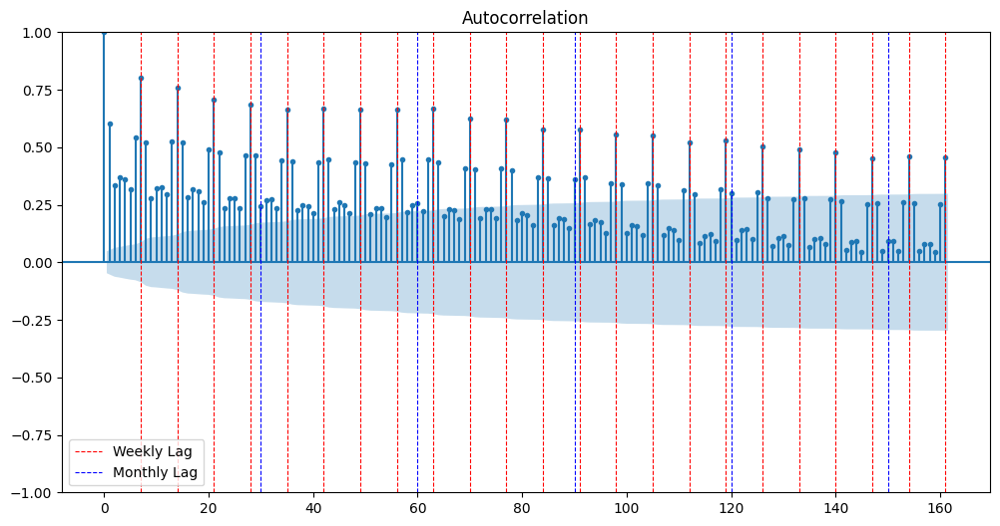

In [82]:
# Number of lags
ACFlags = 161

# Display the ACF-Plots
fig, ax = plt.subplots(figsize=(12, 6))
plot_acf(store_44_sales['sales'], lags=ACFlags, ax=ax, markersize=3)

# Adding vertical lines for weekly patterns
ACFweekly_lags = [7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77, 84, 91, 98, 105, 112, 119, 126, 133, 140, 147, 154, 161]
for lag in ACFweekly_lags:
    ax.axvline(x=lag, color='red', linestyle='--', linewidth=0.8, label='Weekly Lag' if lag == 7 else "")

# Adding vertical lines for monthly patterns
ACFmonthly_lags = [30, 60, 90, 120, 150]
for lag in ACFmonthly_lags:
    ax.axvline(x=lag, color='blue', linestyle='--', linewidth=0.8, label='Monthly Lag' if lag == 30 else "")

# Adjusting the legend
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

# Display the ACF-Plots
plt.show()

*Peaks at:*

&rarr; In general, peaks can be recognized in 7-day steps. However, they stand out in particular:
- Lag 7
- Lag 63
- Lag 91
- Lag 119

#### ACF Family

In [83]:
# Aggregated sales figures for the GROCERY I family per day
family_grocery1_sales = train_merged_df[train_merged_df['family'] == 'GROCERY I'].groupby('date')['sales'].sum().reset_index()
family_grocery1_sales

,date,sales
0,2013-01-01,700.000
1,2013-01-02,202020.000
2,2013-01-03,144878.000
3,2013-01-04,135754.000
4,2013-01-05,188356.000
...,...,...
1683,2017-08-11,238221.922
1684,2017-08-12,238627.633
1685,2017-08-13,258442.452
1686,2017-08-14,225355.694


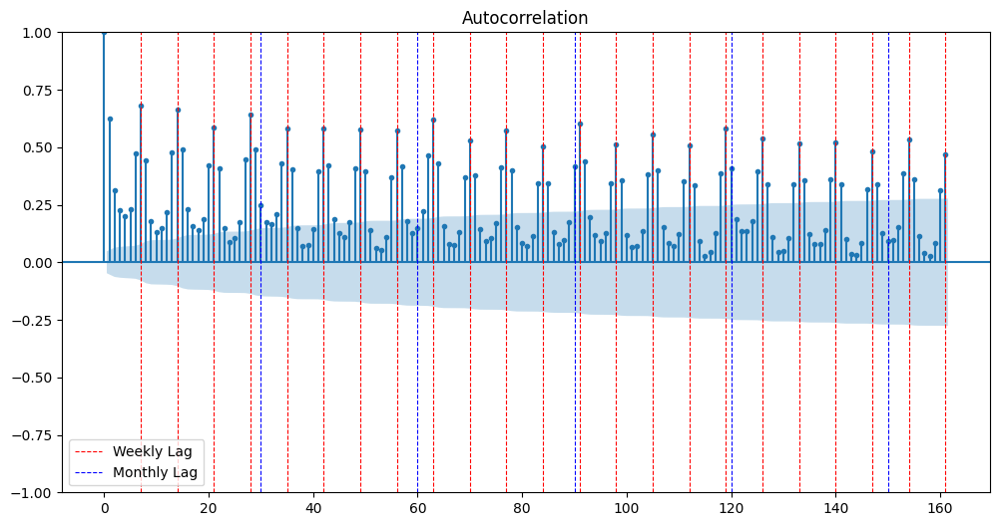

In [84]:
# Generation of the ACF-Plots
fig, ax = plt.subplots(figsize=(12, 6))
plot_acf(family_grocery1_sales['sales'], lags=ACFlags, ax=ax, markersize=3)

# Add vertical lines for weekly patterns
ACFweekly_lags = [7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77, 84, 91, 98, 105, 112, 119, 126, 133, 140, 147, 154, 161]
for lag in ACFweekly_lags:
    ax.axvline(x=lag, color='red', linestyle='--', linewidth=0.8, label='Weekly Lag' if lag == 7 else "")

# Add vertical lines for monthly patterns
ACFmonthly_lags = [30, 60, 90, 120, 150]
for lag in ACFmonthly_lags:
    ax.axvline(x=lag, color='blue', linestyle='--', linewidth=0.8, label='Monthly Lag' if lag == 30 else "")

# Adjusting the legende
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

# Display the ACF-Plots
plt.show()

*Peaks at:*

&rarr; In general, peaks can be recognized in 7-day steps. However, they stand out in particular:
- Lag 7
- Lag 28
- Lag 63
- Lag 91
- Lag 119

#### Function for creating lag features

&rarr; Decision for the following lags:
- Lag 1 (as for certain famnilies it is likely that the sales figures correlate with the sales figures of the previous day)
- Lag 7 (1 week)
- Lag 28 (approx. 1 month)
- Lag 63 (approx. 2 months)

&rarr; Sales lags cannot be created for all days:
1. missing values at the beginning of the period:
- The 'sales' column is shifted backwards by the number of days of the lag
- With a lag of 7, this means that the first 7 days of the training period will have missing values
- We fill these with 0
2. missing values within the test period:
- Depending on the value of the lag, there will be missing values in the test period, as we first have to predict the 'sales' column here
- With a lag of 63, this is not a problem as the test period is shorter than the lag period
- With a lag of 7, however, this means that 7 days from the test period can still be filled in, but the remaining 9 days will be missing

&rarr; We will leave these values as missing values for the time being and will use an iterative procedure in the model implementation, which includes the predicted values when creating the sales lags.

In [85]:
def create_lag_features(df, lag_days, start_date='2013-01-01', end_date='2017-08-15'):
    # Sort the DataFrame by 'store_nbr', 'family', 'date'
    df = df.sort_values(by=['store_nbr', 'family', 'date'])
    # Lag-Feature creation
    df[f'sales_lag_{lag_days}'] = df.groupby(['store_nbr', 'family'])['sales'].shift(lag_days)
    # Fill missing values at the beginning with 0
    start_date = pd.to_datetime(start_date)
    df.loc[(df['date'] >= start_date) & (df['date'] < start_date + pd.Timedelta(days=lag_days)), f'sales_lag_{lag_days}'] = 0
    # Determine the number of actual missing values at the end
    end_date = pd.to_datetime(end_date)
    missing_values_end = df[(df['date'] > end_date) & (df[f'sales_lag_{lag_days}'].isna())].shape[0]
    # Output of the number of missing values at the end
    print(f'Anzahl der fehlenden Werte am Ende für sales_lag_{lag_days}: {missing_values_end}')
    return df

In [86]:
# Creation of Lag-Feature for 63 days for full_merged_df
full_merged_df = create_lag_features(full_merged_df, 63)
print(full_merged_df.shape)
full_merged_df.head()

Anzahl der fehlenden Werte am Ende für sales_lag_63: 0
(3036528, 15)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,day_of_month,day_of_week,is_payday,is_school_season,sales_lag_63
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,1,2,0,0,0.0
1782,2013-01-02,1,AUTOMOTIVE,2.0,0,2013,1,1,1,2,2,3,0,0,0.0
3564,2013-01-03,1,AUTOMOTIVE,3.0,0,2013,1,1,1,3,3,4,0,0,0.0
5346,2013-01-04,1,AUTOMOTIVE,3.0,0,2013,1,1,1,4,4,5,0,0,0.0
7128,2013-01-05,1,AUTOMOTIVE,5.0,0,2013,1,1,1,5,5,6,0,0,0.0


In [87]:
# Creation of Lag-Feature for 28 days for full_merged_df
full_merged_df = create_lag_features(full_merged_df, 28)
print(full_merged_df.shape)

Anzahl der fehlenden Werte am Ende für sales_lag_28: 0
(3036528, 16)


In [88]:
# Creation of Lag-Feature for 7 days for full_merged_df
full_merged_df = create_lag_features(full_merged_df, 7)
print(full_merged_df.shape)

Anzahl der fehlenden Werte am Ende für sales_lag_7: 16038
(3036528, 17)


In [89]:
# Creation of Lag-Feature for 1 day for full_merged_df
full_merged_df = create_lag_features(full_merged_df, 1)
print(full_merged_df.shape)

Anzahl der fehlenden Werte am Ende für sales_lag_1: 26730
(3036528, 18)


In [90]:
# Sort back
full_merged_df = full_merged_df.sort_values(by=['date', 'store_nbr', 'family'])
print(full_merged_df.shape)
full_merged_df.head(5)

(3036528, 18)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,day_of_month,day_of_week,is_payday,is_school_season,sales_lag_63,sales_lag_28,sales_lag_7,sales_lag_1
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,1,2,0,0,0.0,0.0,0.0,0.0
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,1,2,0,0,0.0,0.0,0.0,0.0
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,1,2,0,0,0.0,0.0,0.0,0.0
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,1,2,0,0,0.0,0.0,0.0,0.0
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,1,2,0,0,0.0,0.0,0.0,0.0


## 2.2 date_store_df

### Adding to full_merged_df

In [91]:
# Display information of stores_df
print(date_store_df.shape)
print_column_info(date_store_df)
date_store_df.head(5)

(92016, 10)
Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: city
- Datatype: object
- Missing values: 0
- Number of unique values: 22
- Unique values: ['Quito' 'Santo Domingo' 'Cayambe' 'Latacunga' 'Riobamba' 'Ibarra'
 'Guaranda' 'Puyo' 'Ambato' 'Guayaquil' 'Salinas' 'Daule' 'Babahoyo'
 'Quevedo' 'Playas' 'Libertad' 'Cuenca' 'Loja' 'Machala' 'Esmeraldas'
 'Manta' 'El Carmen']

Column: state
- Datatype: object
- Missing values: 0
- Number of unique values: 16
- Unique values: ['Pichincha' 'Santo Domingo de los Tsachilas' 'Cotopaxi' 'Chimborazo'
 'Imbabura' 'Bolivar' 'Pastaza' 'Tungurahua' 'Guayas' 'Santa Elena'
 'Los Rios' 'Azuay' 'Loja' 'El Oro' 'Esmeraldas' 'Manabi']

Column: store_type
- Datatype: object
- Missing values: 0
- Number of

,date,store_nbr,city,state,store_type,cluster,day_type,day_description,event_type,event_description
0,2013-01-01,1,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
1,2013-01-01,2,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
2,2013-01-01,3,Quito,Pichincha,D,8,Holiday,Primer dia del ano,Nothing,No Event
3,2013-01-01,4,Quito,Pichincha,D,9,Holiday,Primer dia del ano,Nothing,No Event
4,2013-01-01,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4,Holiday,Primer dia del ano,Nothing,No Event


In [92]:
# Adding informationen from date_store_df to train_merged_df
full_merged_df = full_merged_df.merge(date_store_df[['date', 'store_nbr', 'city', 'state', 'store_type', 'cluster', 'day_type', 'day_description', 'event_type', 'event_description']], on=['date', 'store_nbr'], how='left')

In [93]:
# Display informationen of full_merged_df
print_column_info(full_merged_df)
print(full_merged_df.shape)
full_merged_df.head(5)

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']

Column: sales
- Datatype: float64
- Missing values: 28512
- Number of unique values: 379610
- Minimum value: 0.0
- Maximum value: 124717.0

Col

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,sales_lag_7,sales_lag_1,city,state,store_type,cluster,day_type,day_description,event_type,event_description
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,D,13,Holiday,Primer dia del ano,Nothing,No Event


### Creation of Binary Columns for day_type and event_type

In [94]:
# Convert column day_type and event_type into binary columns
def encode_day_event_types(df):
    df['is_holiday'] = df['day_type'].apply(lambda x: 1 if x == 'Holiday' else 0)
    df['is_event'] = df['event_type'].apply(lambda x: 1 if x == 'Event' else 0)
    # Löschen der ursprünglichen Spalten
    df.drop(['day_type', 'event_type'], axis=1, inplace=True)
    return df

In [95]:
#Convert day_type and event_type to binary columns
full_merged_df = encode_day_event_types(full_merged_df)
print_column_info(full_merged_df)

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']

Column: sales
- Datatype: float64
- Missing values: 28512
- Number of unique values: 379610
- Minimum value: 0.0
- Maximum value: 124717.0

Col

### Relationship between Holidays and Events and Sales

&rarr; Before we create features for all types of holidays and events, we first examine the general relationship between holidays and events and sales figures and then which types have a relevant impact on sales figures
- The holidays and events can be on a national, regional or local level
- Therefore, we look at the sales figures for a specific store

#### Selection of Representative Store

In [96]:
# Analysis of the distribution of the 54 unique stores across states and cities

# Number of stores per state
stores_per_state = date_store_df.groupby('state')['store_nbr'].nunique().reset_index()
# Spalte 'store_nbr' in 'store_count' umbenennen
stores_per_state = stores_per_state.rename(columns={'store_nbr': 'store_count'})

# Number of stores per city
stores_per_city = date_store_df.groupby('city')['store_nbr'].nunique().reset_index()
# Renaming column 'store_nbr' in 'store_count'
stores_per_city = stores_per_city.rename(columns={'store_nbr': 'store_count'})
# Add an additional column for the state of the respective city in stores_per_city
stores_per_city = stores_per_city.merge(date_store_df[['city', 'state']].drop_duplicates(), on='city', how='left')

In [97]:
# Sorting stores_per_state and stores_per_city according to states
stores_per_state = stores_per_state.sort_values(by='state')
stores_per_city = stores_per_city.sort_values(by='state')

In [98]:
# Function to shorten the description
def shorten_label(label, max_length=12):
    return (label[:max_length-1] + '...') if len(label) > max_length else label

# Shorten the description for the plot
short_states = stores_per_state['state'].apply(shorten_label)
short_cities = stores_per_city['city'].apply(shorten_label)

In [99]:
# Colors for the states, with reuse if necessary
colors = px.colors.qualitative.Plotly * (len(stores_per_state) // len(px.colors.qualitative.Plotly) + 1)

# Creation of subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=('Number of Stores in Each State', 'Number of Stores in Each City'), shared_yaxes=True, vertical_spacing=0.1, horizontal_spacing=0.1)

# Add bar chart for number of stores in each state
fig.add_trace(
    go.Bar(x=short_states, y=stores_per_state['store_count'], marker_color=colors[:len(stores_per_state)], name='Stores per State', hovertext=stores_per_state['state'], hoverinfo='text'),
    row=1, col=1
)

# Add bar chart for number of stores in each city
fig.add_trace(
    go.Bar(x=short_cities, y=stores_per_city['store_count'], marker_color=stores_per_city['state'].apply(lambda state: colors[stores_per_state['state'].tolist().index(state)]), name='Stores per City', hovertext=stores_per_city['city'], hoverinfo='text'),
    row=1, col=2
)

# Layout-adjustments
fig.update_layout(height=400, width=1000, showlegend=False)
fig.update_layout(margin=dict(l=80, r=40, t=60, b=60))

# Axis labels and angle adjustments
fig.update_xaxes(title_text='State', tickangle=45, row=1, col=1)
fig.update_yaxes(title_text='Number of Stores', row=1, col=1)
fig.update_xaxes(title_text='City', tickangle=45, row=1, col=2)

# Display plots
fig.show()

- Most stores are located in the state 'Pichincha'
- Within the state 'Pichincha' most stores are located in the same city 'Quito'

&rarr; Since a large part of the stores are located in the city of 'Quito', we look at the influence of holidays and events for the store with the highest daily sales in this city

In [100]:
# Store with highest average daily sales in City 'Quito'
# filter full_merged_df on rows that have date in column 'date' within date_range_train
store_sales_quito = full_merged_df[(full_merged_df['city'] == 'Quito') & (full_merged_df['date'].isin(date_range_train))].groupby('store_nbr')['sales'].mean().reset_index()
store_sales_quito = store_sales_quito.sort_values(by='sales', ascending=False)
store_sales_quito.head(3)

,store_nbr,sales
12,44,1114.597753
13,45,978.350036
15,47,914.625701


In [101]:
# Filtering the full_merged_df by store_nbr 44 and date_range_train
store_44_df = full_merged_df[(full_merged_df['store_nbr'] == 44) & (full_merged_df['date'].isin(date_range_train))]
print(store_44_df.shape)
store_44_df.head(5)

(55704, 26)


,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,sales_lag_7,sales_lag_1,city,state,store_type,cluster,day_description,event_description,is_holiday,is_event
1419,2013-01-01,44,AUTOMOTIVE,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,A,5,Primer dia del ano,No Event,1,0
1420,2013-01-01,44,BABY CARE,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,A,5,Primer dia del ano,No Event,1,0
1421,2013-01-01,44,BEAUTY,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,A,5,Primer dia del ano,No Event,1,0
1422,2013-01-01,44,BEVERAGES,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,A,5,Primer dia del ano,No Event,1,0
1423,2013-01-01,44,BOOKS,0.0,0,2013,1,1,1,1,...,0.0,0.0,Quito,Pichincha,A,5,Primer dia del ano,No Event,1,0


In [102]:
# Creation of DataFrame for Store 44 only containing relevant columns
store_44_holidays_events = store_44_df[['date', 'store_nbr', 'family', 'sales', 'onpromotion', 'is_holiday', 'is_event', 'day_description', 'event_description']]

# Aggregate sales numbers per day and keep the other columns
store_44_holidays_events = store_44_holidays_events.groupby('date').agg({'sales': 'sum', 'onpromotion': 'sum', 'is_holiday': 'first', 'is_event': 'first', 'day_description': 'first', 'event_description': 'first'}).reset_index()

print(store_44_holidays_events.shape)
store_44_holidays_events.head(5)

(1688, 7)


,date,sales,onpromotion,is_holiday,is_event,day_description,event_description
0,2013-01-01,0.000,0,1,0,Primer dia del ano,No Event
1,2013-01-02,30095.181,0,0,0,Regular Day,No Event
2,2013-01-03,20447.057,0,0,0,Regular Day,No Event
3,2013-01-04,22795.799,0,0,0,Regular Day,No Event
4,2013-01-05,31382.508,0,0,0,Regular Day,No Event


#### Overall Relationship

&rarr; We now compare the aggregated daily sales of Store 44 with the sales on public holidays and events to analyse whether holidays and events have a general impact on sales

In [103]:
# Calculate the 90-day rolling average of sales for store_44_holidays_events
store_44_holidays_events['sales_rolling_90_mean'] = store_44_holidays_events['sales'].rolling(window=90).mean()

In [104]:
# Generate plot of daily sales for Store 43 - holidays are highlighted
fig = go.Figure()

# Daily sales
fig.add_trace(go.Scatter(x=store_44_holidays_events['date'], y=store_44_holidays_events['sales'], mode='lines', line_color='#636EFA', name='Sales'))

# 90-Day Rolling Average of Sales in darker color
fig.add_trace(go.Scatter(x=store_44_holidays_events['date'], y=store_44_holidays_events['sales_rolling_90_mean'], mode='lines', line_color='#3C4297', name='90-Day Rolling Mean'))

# Holidays are highlighted with circles
holidays = store_44_holidays_events[store_44_holidays_events['is_holiday'] == 1]
fig.add_trace(go.Scatter(x=holidays['date'], y=holidays['sales'], mode='markers', marker_symbol='circle', marker_size=5, marker_color='#EF553B', name='Holidays'))
# Events are highlighted with circles
events = store_44_holidays_events[store_44_holidays_events['is_event'] == 1]
fig.add_trace(go.Scatter(x=events['date'], y=events['sales'], mode='markers', marker_symbol='circle', marker_size=5, marker_color='#FFA15A', name='Events'))

# Layout adjustments
fig.update_layout(title='Daily Sales for Store 44 with Holidays Highlighted', xaxis_title='Date', yaxis_title='Sales', height=400, width=1000, showlegend=False)
fig.update_layout(margin=dict(l=80, r=40, t=60, b=60))
fig.show()

&rarr; The data reveals a selective correlation between holidays/events and sales figures.
While not universally applicable, certain dates correspond to notable increases in sales,
indicating a potential causal relationship between special occasions and sales performance.

#### Identifying Relevant Holidays and Events

Analysis steps:
1. Examination of the effects of various holiday and event types
   on sales figures.
2. Creation of additional features for significant holidays and events.
3. Comparative analysis between average daily sales figures
   and sales figures on specific holidays/events in Store 44.

Methodology:
- Statistical evaluation of sales data for various time periods
- Identification of deviations from the average on holidays/events
- Feature engineering based on the results of the analysis

Expected outcome:
- Improved understanding of temporal influencing factors and optimized
- prediction accuracy of the model through targeted feature expansion.


##### Holidays

In [105]:
# Average sales of store_44_sales on non-holidays
store_44_sales_regular = store_44_holidays_events[store_44_holidays_events['is_holiday'] == 0]['sales'].mean()
store_44_sales_regular

36543.20151824218

In [106]:
# Aggregate sales figures by holiday description
store_44_sales_holidays = store_44_holidays_events[store_44_holidays_events['is_holiday'] == 1].groupby('day_description')['sales'].agg(['mean', 'count']).reset_index()

In [107]:
# Difference between the average sales figures on holidays and non-holidays
store_44_sales_holidays['sales_diff'] = store_44_sales_holidays['mean'] / store_44_sales_regular

In [108]:
# Threshold values for sales differences
sales_diff_upper_holiday = 1.2
sales_diff_lower_holiday = 0.8

In [109]:
# Filter rows based on threshold values
relevant_holidays = store_44_sales_holidays[(store_44_sales_holidays['sales_diff'] > sales_diff_upper_holiday) | (store_44_sales_holidays['sales_diff'] < sales_diff_lower_holiday)]
# Drop rows where the mean value is 0, as stores are closed there
relevant_holidays = relevant_holidays[relevant_holidays['mean'] != 0]
relevant_holidays

,day_description,mean,count,sales_diff
1,Dia de Difuntos,48040.848600,5,1.314632
2,Dia de la Madre-1,49765.320630,5,1.361822
3,Dia del Trabajo,48558.802792,5,1.328805
6,Post Navidad,44227.295050,4,1.210274
7,Pre Navidad,51769.020835,16,1.416653
8,Primer dia del ano,26944.797504,10,0.737341
9,Regional Celebrations,45962.476758,8,1.257757


In [110]:
# Sort holidays by sales_diff
relevant_holidays = relevant_holidays.sort_values(by='sales_diff', ascending=False)

In [111]:
# Plotting sales figures by holiday description in comparison to regular days as a bar chart and number of holidays with line at sales_diff = 1
fig = px.bar(relevant_holidays, x='day_description', y='sales_diff', title='Sales on Holidays Compared to Regular Days', labels={'day_description': 'Holiday Description', 'sales_diff': 'Sales Difference'}, color='count', color_continuous_scale='Purp')
fig.add_hline(y=1, line_dash='dot', line_color='black', annotation_text='Regular Sales', annotation_position='bottom right')
fig.update_yaxes(range=[0, 2])
fig.update_layout(height=400, width=1200)
fig.show()

##### Events

In [112]:
# Average sales of store_44_sales on non-event days
store_44_sales_nothing = store_44_holidays_events[store_44_holidays_events['is_event'] == 0]['sales'].mean()
store_44_sales_nothing

36562.971323037964

In [113]:
# Aggregate sales figures by event description
store_44_sales_events = store_44_holidays_events[store_44_holidays_events['is_event'] == 1].groupby('event_description')['sales'].agg(['mean', 'count']).reset_index()

In [114]:
# Difference between the average sales figures on event and non-event days
store_44_sales_events['sales_diff'] = store_44_sales_events['mean'] / store_44_sales_nothing

In [115]:
# Threshold values for sales differences
sales_diff_upper_event = 1.2
sales_diff_lower_event = 0.8

In [116]:
# Filter rows based on threshold values
relevant_events = store_44_sales_events[(store_44_sales_events['sales_diff'] > sales_diff_upper_event) | (store_44_sales_events['sales_diff'] < sales_diff_lower_event)]
# Drop rows where the mean value is 0, as stores are closed there
relevant_events = relevant_events[relevant_events['mean'] != 0]
relevant_events

,event_description,mean,count,sales_diff
4,Terremoto Manabi,47281.715000,1,1.293158
5,Terremoto Manabi 1W,66528.187444,7,1.819551
6,Terremoto Manabi 2W,44877.481244,7,1.227402
7,Terremoto Manabi 3W,48381.855269,7,1.323247


In [117]:
# Sort events by sales_diff
relevant_events = relevant_events.sort_values(by='sales_diff', ascending=False)

In [118]:
# Plotting sales figures by event description in comparison to regular days as a bar chart and number of events with line at sales_diff = 1
fig = px.bar(relevant_events, x='event_description', y='sales_diff', title='Sales on Events Compared to Regular Days', labels={'event_description': 'Event Description', 'sales_diff': 'Sales Difference'}, color='count', color_continuous_scale='Purp')
fig.add_hline(y=1, line_dash='dot', line_color='black', annotation_text='Regular Sales', annotation_position='bottom right')
fig.update_yaxes(range=[0, 2])
fig.update_layout(height=400, width=1200)
fig.show()

### Creation of Holiday and Event Features

In [119]:
# Function for creating dummy variables for relevant holidays and events
def create_holiday_event_dummies(df):
    # Dummy variables for relevant holidays
    for holiday in relevant_holidays['day_description']:
        df[f'is_{holiday.lower().replace(" ", "_")}_holiday'] = (df['day_description'] == holiday).astype(int)
    # Dummy variables for relevant events
    for event in relevant_events['event_description']:
        df[f'is_{event.lower().replace(" ", "_")}_event'] = (df['event_description'] == event).astype(int)
    return df

In [120]:
# Dummy variables for relevant holidays and events in full_merged_df
full_merged_df = create_holiday_event_dummies(full_merged_df)
# Remove the original columns 'day_description' and 'event_description'
full_merged_df.drop(['day_description', 'event_description'], axis=1, inplace=True)
print_column_info(full_merged_df)
print(full_merged_df.shape)
full_merged_df.head()

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 1
- Maximum value: 54

Column: family
- Datatype: object
- Missing values: 0
- Number of unique values: 33
- Unique values: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']

Column: sales
- Datatype: float64
- Missing values: 28512
- Number of unique values: 379610
- Minimum value: 0.0
- Maximum value: 124717.0

Col

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_dia_de_la_madre-1_holiday,is_dia_del_trabajo_holiday,is_dia_de_difuntos_holiday,is_regional_celebrations_holiday,is_post_navidad_holiday,is_primer_dia_del_ano_holiday,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,...,0,0,0,0,0,1,0,0,0,0
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,...,0,0,0,0,0,1,0,0,0,0
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,...,0,0,0,0,0,1,0,0,0,0
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,...,0,0,0,0,0,1,0,0,0,0
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,...,0,0,0,0,0,1,0,0,0,0


## 2.3 oil_df

### Adding to full_merged_df

In [121]:
# Display and information of oil_df_full
print_column_info(oil_df_full)
print(oil_df_full.shape)
oil_df_full.head(5)

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1704
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-31 00:00:00

Column: dcoilwtico
- Datatype: float64
- Missing values: 0
- Number of unique values: 1495
- Minimum value: 26.19
- Maximum value: 110.62

(1704, 2)


,date,dcoilwtico
0,2013-01-01,93.140000
1,2013-01-02,93.140000
2,2013-01-03,92.970000
3,2013-01-04,93.120000
4,2013-01-05,93.146667


In [122]:
# Adding oil prices to full_merged_df
train_merged_df = train_merged_df.merge(oil_df_full, on='date', how='left')

In [123]:
# Adding oil prices to full_merged_df
full_merged_df = full_merged_df.merge(oil_df_full, on='date', how='left')

In [124]:
# Generate overview of train_merged_df
print(full_merged_df.shape)
full_merged_df.isnull().sum()

(3036528, 36)


date                                    0
store_nbr                               0
family                                  0
sales                               28512
onpromotion                             0
year                                    0
quarter                                 0
month                                   0
week_of_year                            0
day_of_year                             0
day_of_month                            0
day_of_week                             0
is_payday                               0
is_school_season                        0
sales_lag_63                            0
sales_lag_28                            0
sales_lag_7                         16038
sales_lag_1                         26730
city                                    0
state                                   0
store_type                              0
cluster                                 0
is_holiday                              0
is_event                          

### Relationship between Oil Price and Sales

In [125]:
# Plotting the relationship between daily_sales_total and oil price over time
fig = make_subplots(rows=1, cols=2, subplot_titles=('Average Daily Sales Over Time', 'Oil Price Over Time'))

# Overall daily sales
fig.add_trace(go.Scatter(x=daily_sales_total['date'], y=daily_sales_total['sales'], mode='lines', name='Total Sales'), row=1, col=1)
# Oil price over time
fig.add_trace(go.Scatter(x=oil_df_full['date'], y=oil_df_full['dcoilwtico'], mode='lines', name='Oil Price'), row=1, col=2)

# Layout adjustments
fig.update_layout(height=400, width=1000, showlegend=False)
fig.update_layout(margin=dict(l=60, r=60, t=60, b=60))
fig.show()

In [126]:
# Merge daily_sales_total and oil_df_full
sales_oil_df = daily_sales_total.merge(oil_df_full, on='date', how='left')
print(sales_oil_df.shape)
print(sales_oil_df.isnull().sum())
sales_oil_df.head(5)

(1688, 3)
date          0
sales         0
dcoilwtico    0
dtype: int64


,date,sales,dcoilwtico
0,2013-01-01,1.409438,93.140000
1,2013-01-02,278.390807,93.140000
2,2013-01-03,202.840197,92.970000
3,2013-01-04,198.911154,93.120000
4,2013-01-05,267.873244,93.146667


In [127]:
# Calculate correlation between average daily sales and oil price
sales_oil_corr = sales_oil_df['sales'].corr(sales_oil_df['dcoilwtico'])
sales_oil_corr

-0.6201974484957687

In [128]:
# Generate scatter plot with regression line between sales and oil price
fig = px.scatter(sales_oil_df, x='dcoilwtico', y='sales', trendline='ols', title='Average Sales vs. Oil Price')
fig.update_layout(height=400, width=800, margin=dict(l=80, r=40, t=60, b=60))
fig.show()

Key findings:
1. Inverse relationship: Oil price increase correlates with sales figure decrease and vice versa.

2. Effects of rising oil prices:
   - Potential increase in production and transportation costs
   - Possible transfer to consumer prices
   - Reduction in consumers' disposable income due to higher fuel expenses

3. Effects of falling oil prices:
   - Potential decrease in production and transportation costs
   - Possible reduction in consumer prices
   - Increase in consumers' disposable income due to lower fuel expenses

Hypothesis: Oil price fluctuations influence consumer behavior through impacts 
on production costs and consumers' disposable income.

## 2.4 transactions_df

### Adding to full_merged_df

In [129]:
# Generate overview of full_merged_df
print(transactions_df_full.shape)
print(transactions_df_full.isnull().sum())
transactions_df_full.head(5)

(91152, 3)
date            0
store_nbr       0
transactions    0
dtype: int64


,date,store_nbr,transactions
0,2013-01-01,1,0.0
1,2013-01-01,2,0.0
2,2013-01-01,3,0.0
3,2013-01-01,4,0.0
4,2013-01-01,5,0.0


In [130]:
# Adding the column 'transactions' to train_merged_df based on 'store_nbr' and 'date'
train_merged_df = train_merged_df.merge(transactions_df_full, on=['store_nbr', 'date'], how='left')

In [131]:
# Adding the column 'transactions' to full_merged_df based on 'store_nbr' and 'date'
full_merged_df = full_merged_df.merge(transactions_df_full, on=['store_nbr', 'date'], how='left')

In [132]:
# Anzeigen und Informationen von train_merged_df
print(full_merged_df.shape)
print(full_merged_df.isnull().sum())
full_merged_df.head(5)

(3036528, 37)
date                                    0
store_nbr                               0
family                                  0
sales                               28512
onpromotion                             0
year                                    0
quarter                                 0
month                                   0
week_of_year                            0
day_of_year                             0
day_of_month                            0
day_of_week                             0
is_payday                               0
is_school_season                        0
sales_lag_63                            0
sales_lag_28                            0
sales_lag_7                         16038
sales_lag_1                         26730
city                                    0
state                                   0
store_type                              0
cluster                                 0
is_holiday                              0
is_event            

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_dia_de_difuntos_holiday,is_regional_celebrations_holiday,is_post_navidad_holiday,is_primer_dia_del_ano_holiday,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event,dcoilwtico,transactions
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,...,0,0,0,1,0,0,0,0,93.14,0.0
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,...,0,0,0,1,0,0,0,0,93.14,0.0
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,...,0,0,0,1,0,0,0,0,93.14,0.0
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,...,0,0,0,1,0,0,0,0,93.14,0.0
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,...,0,0,0,1,0,0,0,0,93.14,0.0


&rarr; We can see that there are 28512 missing values in the 'transactions' column as we don't have any transaction data for the test period

### Relationship between Transactions and Sales

In [133]:
# Aggregate sales by date and store_nbr
daily_sales_store = train_df_full.groupby(['date', 'store_nbr'])['sales'].mean().reset_index()
print(daily_sales_store.shape)
daily_sales_store.head(5)

(91152, 3)


,date,store_nbr,sales
0,2013-01-01,1,0.0
1,2013-01-01,2,0.0
2,2013-01-01,3,0.0
3,2013-01-01,4,0.0
4,2013-01-01,5,0.0


In [134]:
# Plotting the relationship between daily_sales_total and oil price over time
fig = make_subplots(rows=1, cols=2, subplot_titles=('Average Daily Sales Over Time', 'Average Daily Transactions Over Time'))

# Overall daily sales
daily_sales_total = train_df_full.groupby('date')['sales'].mean().reset_index()
fig.add_trace(go.Scatter(x=daily_sales_total['date'], y=daily_sales_total['sales'], mode='lines', name='Total Sales'), row=1, col=1)

# Overall daily transactions
daily_transactions_total = transactions_df_full.groupby('date')['transactions'].mean().reset_index()
fig.add_trace(go.Scatter(x=daily_transactions_total['date'], y=daily_transactions_total['transactions'], mode='lines', name='Total Transactions'), row=1, col=2)

# Layout adjustments
fig.update_layout(height=400, width=1000, showlegend=False)
fig.update_layout(margin=dict(l=60, r=60, t=60, b=60))
fig.show()

In [135]:
# Merge daily_sales_store and transactions_df_full
sales_transactions_df = daily_sales_store.merge(transactions_df_full, on=['store_nbr', 'date'], how='left')
print(sales_transactions_df.shape)
print(sales_transactions_df.isnull().sum())
sales_transactions_df.head(5)

(91152, 4)
date            0
store_nbr       0
sales           0
transactions    0
dtype: int64


,date,store_nbr,sales,transactions
0,2013-01-01,1,0.0,0.0
1,2013-01-01,2,0.0,0.0
2,2013-01-01,3,0.0,0.0
3,2013-01-01,4,0.0,0.0
4,2013-01-01,5,0.0,0.0


In [136]:
# Calculate correlation between average daily sales and transactions
sales_transactions_corr = sales_transactions_df['sales'].corr(sales_transactions_df['transactions'])
sales_transactions_corr

0.8581702027231788

In [137]:
# Scatter plot with regression line between sales and transactions
fig = px.scatter(sales_transactions_df, x='transactions', y='sales', trendline='ols', title='Average Sales vs. Transactions')
fig.update_layout(height=400, width=800, margin=dict(l=80, r=40, t=60, b=60))
fig.show()

Key finding:
&rarr; As we expected there is a strong positive correlation between sales and the number of transactions (0.858)

## 2.5 Weather

### Adding to full_merged_df

In [138]:
# Generate overview of weather_store_df
print(weather_store_df.shape)
print(weather_store_df.isnull().sum())
weather_store_df.head(5)

(92016, 10)
date                         0
store_nbr                    0
city                         0
state                        0
store_type                   0
cluster                      0
temperature_2m_mean (°C)     0
sunshine_duration (s)        0
rain_sum (mm)                0
wind_speed_10m_max (km/h)    0
dtype: int64


,date,store_nbr,city,state,store_type,cluster,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
0,2013-01-01,1,Quito,Pichincha,D,13,12.0,33947.31,6.5,5.2
1,2013-01-01,2,Quito,Pichincha,D,13,12.0,33947.31,6.5,5.2
2,2013-01-01,3,Quito,Pichincha,D,8,12.0,33947.31,6.5,5.2
3,2013-01-01,4,Quito,Pichincha,D,9,12.0,33947.31,6.5,5.2
4,2013-01-01,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4,22.0,37434.58,7.0,7.4


In [139]:
# Add information from weather_store_df to full_merged_df
full_merged_df = full_merged_df.merge(weather_store_df[['date', 'store_nbr', 'temperature_2m_mean (°C)', 'sunshine_duration (s)', 'rain_sum (mm)', 'wind_speed_10m_max (km/h)']],
                                        on=['date', 'store_nbr'], how='left')

In [140]:
print(full_merged_df.shape)
print(full_merged_df.isnull().sum())
full_merged_df.head(5)

(3036528, 41)
date                                    0
store_nbr                               0
family                                  0
sales                               28512
onpromotion                             0
year                                    0
quarter                                 0
month                                   0
week_of_year                            0
day_of_year                             0
day_of_month                            0
day_of_week                             0
is_payday                               0
is_school_season                        0
sales_lag_63                            0
sales_lag_28                            0
sales_lag_7                         16038
sales_lag_1                         26730
city                                    0
state                                   0
store_type                              0
cluster                                 0
is_holiday                              0
is_event            

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event,dcoilwtico,transactions,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2


&rarr; We successfully added our four selected weather parameters and there are no missing values in those four columns

In [141]:
# Saving full_merged_df as CSV file
# full_merged_df.to_csv('Data/Full_DataFrames/full_merged_df.csv', index=False)

# 3 Model Implementation

- We do not only need to predict the daily sales, but the daily sales for each combination of the 54 stores and the 33 product families &rarr; This means that we need to predict 54 (stores) * 33 (families) = 1782 values per day
- We have 1782 target series but traditional statistical models are focused on forecasting a single target series per model
- Therefore we decided to implement a global model which is able to forecast multiple target series in one model
- We do not implement just one model, as the sales and their fluctuations vary strongly across the different combinations of store and family

&rarr; As we established that the different product families have different seasonal patterns, we decided to train 33 models, one for each product family, which then predicts the sales for each store

&rarr; For computational reasons we chose LightGBM

## 3.1 Label Encoding

- The full_merged_df still has some columns that have a non-numeric data type &rarr; We need to convert those columns to a numeric data type
- The method that is the clearest to interpret for the model is one-hot encoding, where a binary column is created for each unique value of a column
- But since many columns have a high cardinality this would lead to very large amounts of data
- Some models, including LightGBM, also work well with label encoding, where all unique values of a column are simply numbered from 0 to n, as long as they are categorical columns

&rarr; Since in our non-numeric columns the unique values have no specific order and the columns can be considered categorical, we will use label encoding

In [142]:
# Print data types of all columns
full_merged_df.dtypes

date                                datetime64[ns]
store_nbr                                    int64
family                                      object
sales                                      float64
onpromotion                                  int64
year                                         int32
quarter                                      int32
month                                        int32
week_of_year                                UInt32
day_of_year                                  int32
day_of_month                                 int32
day_of_week                                  int32
is_payday                                    int64
is_school_season                             int64
sales_lag_63                               float64
sales_lag_28                               float64
sales_lag_7                                float64
sales_lag_1                                float64
city                                        object
state                          

In [144]:
# Create copy of full_merged_df 
full_merged_num = full_merged_df.copy()

&rarr; For completeness we also define the columns 'store_nbr' and 'cluster' as categorical columns although they already have numerical datatypes

In [146]:
# List of categorical columns
categorical_columns = ['store_nbr', 'family', 'city', 'state', 'store_type', 'cluster']

In [147]:
# Initialiuze LabelEncoder
label_encoders = {}
mappings = {}

In [148]:
# Encode each categorical column and save  mapping
for col in categorical_columns:
    le = LabelEncoder()
    full_merged_num[col] = le.fit_transform(full_merged_num[col])
    label_encoders[col] = le
    mappings[col] = pd.DataFrame({
        'original': le.classes_,
        'encoded': range(len(le.classes_))
    })

In [149]:
# Output mappings
for col, df in mappings.items():
    print(f'Mapping for {col}:')
    print(df)
    print()

Mapping for store_nbr:
    original  encoded
0          1        0
1          2        1
2          3        2
3          4        3
4          5        4
5          6        5
6          7        6
7          8        7
8          9        8
9         10        9
10        11       10
11        12       11
12        13       12
13        14       13
14        15       14
15        16       15
16        17       16
17        18       17
18        19       18
19        20       19
20        21       20
21        22       21
22        23       22
23        24       23
24        25       24
25        26       25
26        27       26
27        28       27
28        29       28
29        30       29
30        31       30
31        32       31
32        33       32
33        34       33
34        35       34
35        36       35
36        37       36
37        38       37
38        39       38
39        40       39
40        41       40
41        42       41
42        43       42
43       

&rarr; We have now converted the categorical columns into numerical columns and created mappings in order to be able to assign the converted values to the original values again

## 3.2 Train and Test Splitting

### Actual Train Test Split

&rarr; As now all relevant features are created we can split the full_merged_df back into train and test set
- train set: date_range_train
- test set: date_range_test

In [150]:
# Split full_merged_num into train_merged_num (date_range_train) and test_merged_num (date_range_test)
train_merged_num = full_merged_num[full_merged_num['date'].isin(date_range_train)]
test_merged_num = full_merged_num[full_merged_num['date'].isin(date_range_test)]

#### Train Set

In [151]:
# Generate information about train_merged_num
print(train_merged_num.shape)
print_column_info(train_merged_num)
train_merged_num.head()

(3008016, 41)
Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1688
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-08-15 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 0
- Maximum value: 53

Column: family
- Datatype: int64
- Missing values: 0
- Number of unique values: 33
- Unique values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32]

Column: sales
- Datatype: float64
- Missing values: 0
- Number of unique values: 379610
- Minimum value: 0.0
- Maximum value: 124717.0

Column: onpromotion
- Datatype: int64
- Missing values: 0
- Number of unique values: 362
- Minimum value: 0
- Maximum value: 741

Column: year
- Datatype: int32
- Missing values: 0
- Number of unique values: 5
- Unique values: [2013 2014 2015 2016 2017]

Column: quarter
- Datatype: int32
- Missing values: 0
- Number of unique values: 4
- Unique values:

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event,dcoilwtico,transactions,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
0,2013-01-01,0,0,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
1,2013-01-01,0,1,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
2,2013-01-01,0,2,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
3,2013-01-01,0,3,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2
4,2013-01-01,0,4,0.0,0,2013,1,1,1,1,...,0,0,0,0,93.14,0.0,12.0,33947.31,6.5,5.2


&rarr; No missing values in train set

#### Test Set

In [152]:
# Informationen zu test_merged_num
print(test_merged_num.shape)
print_column_info(test_merged_num)
test_merged_num.head()

(28512, 41)
Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 16
- Unique values: <DatetimeArray>
['2017-08-16 00:00:00', '2017-08-17 00:00:00', '2017-08-18 00:00:00',
 '2017-08-19 00:00:00', '2017-08-20 00:00:00', '2017-08-21 00:00:00',
 '2017-08-22 00:00:00', '2017-08-23 00:00:00', '2017-08-24 00:00:00',
 '2017-08-25 00:00:00', '2017-08-26 00:00:00', '2017-08-27 00:00:00',
 '2017-08-28 00:00:00', '2017-08-29 00:00:00', '2017-08-30 00:00:00',
 '2017-08-31 00:00:00']
Length: 16, dtype: datetime64[ns]

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 0
- Maximum value: 53

Column: family
- Datatype: int64
- Missing values: 0
- Number of unique values: 33
- Unique values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32]

Column: sales
- Datatype: float64
- Missing values: 28512
- Number of unique values: 0
- Unique values: [nan]

Column: onpromot

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event,dcoilwtico,transactions,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
3008016,2017-08-16,0,0,NaN,0,2017,3,8,33,228,...,0,0,0,0,46.8,NaN,14.1,41071.21,1.3,12.0
3008017,2017-08-16,0,1,NaN,0,2017,3,8,33,228,...,0,0,0,0,46.8,NaN,14.1,41071.21,1.3,12.0
3008018,2017-08-16,0,2,NaN,2,2017,3,8,33,228,...,0,0,0,0,46.8,NaN,14.1,41071.21,1.3,12.0
3008019,2017-08-16,0,3,NaN,20,2017,3,8,33,228,...,0,0,0,0,46.8,NaN,14.1,41071.21,1.3,12.0
3008020,2017-08-16,0,4,NaN,0,2017,3,8,33,228,...,0,0,0,0,46.8,NaN,14.1,41071.21,1.3,12.0


Identified columns with missing values:
1. 'sales': 28512 missing values &rarr; Target variable for prediction
2. 'sales_lag_7': 16038 missing values &rarr; Time shift of the 'sales' column (7 days), which means that missing values will be filled in gradually after the predictions have been made
3. 'sales_lag_1': 26730 missing values &rarr; Time shift of the 'sales' column (1 day), which means that missing values will be filled in gradually after the predictions have been made
5. 'transactions': 28512 missing values &rarr; Transaction data not available for test period 

&rarr; As we have no transaction data for the test period we cannot use 'transactions' column as a feature and therefore remove this column from both the train and the test set

In [153]:
# Remove the 'transactions' column from all dataframes
full_merged_num = full_merged_num.drop('transactions', axis=1)
train_merged_num = train_merged_num.drop('transactions', axis=1)
test_merged_num = test_merged_num.drop('transactions', axis=1)
print(full_merged_num.shape)
print(train_merged_num.shape)
print(test_merged_num.shape)

(3036528, 40)
(3008016, 40)
(28512, 40)


### Rehearsal Train Test Split

&rarr; Before making the actual predictions for the test period we want to test the accuracy of our model to determine weather we need to do any adjustments or add additional features for more precise forecasting
- To measure the accuracy, we let the model predict the sales for a section of the training set and then compare the predicted values with the actual values
- As we have just seen, we do not have all values in all columns (sales lags) available for the actual test period, as some values can only be calculated successively on the basis of our predictions
- Since we want to calculate the accuracy as representatively as possible, we create a train rehearsal and a test rehearsal set from the actual train set, whereby the test rehearsal set should have the same conditions as the actual test set

Actual Train and Test Set:
1. Train Set: 2013-01-01 to 2017-08-15 &rarr; date_range_train (1688 days)
2. Test Set: 2017-08-16 to 2017-08-31 &rarr; date_range_test (16 days)

&rarr; The test rehearsal set should cover an equally long period, so we split off the last 16 days of the training set

Rehearsal Train and Test Set:
1. Rehearsal Train Set: 2013-01-01 to 2017-07-30 &rarr; 1688 - 16 = 1672 days
2. Rehearsal Test Set: 2017-07-31 to 2017-08-15 &rarr; 16 days &rarr; We define this period as date_range_rehearsal

In [154]:
# Create rehearsal time frame(pre-test period) for the test data set
date_range_rehearsal = pd.date_range(start='2017-07-31', end='2017-08-15') # 16 days

In [155]:
# Split train_merged_num into train_rehearsal and test_rehearsal
train_rehearsal = train_merged_num[~train_merged_num['date'].isin(date_range_rehearsal)]
test_rehearsal = train_merged_num[train_merged_num['date'].isin(date_range_rehearsal)]
print(train_rehearsal.shape)
print(test_rehearsal.shape)

(2979504, 40)
(28512, 40)


#### Train Rehearsal

In [156]:
# Generate information about train_rehearsal
print_column_info(train_rehearsal)
train_rehearsal.head()

Column: date
- Datatype: datetime64[ns]
- Missing values: 0
- Number of unique values: 1672
- Minimum value: 2013-01-01 00:00:00
- Maximum value: 2017-07-30 00:00:00

Column: store_nbr
- Datatype: int64
- Missing values: 0
- Number of unique values: 54
- Minimum value: 0
- Maximum value: 53

Column: family
- Datatype: int64
- Missing values: 0
- Number of unique values: 33
- Unique values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32]

Column: sales
- Datatype: float64
- Missing values: 0
- Number of unique values: 376236
- Minimum value: 0.0
- Maximum value: 124717.0

Column: onpromotion
- Datatype: int64
- Missing values: 0
- Number of unique values: 362
- Minimum value: 0
- Maximum value: 741

Column: year
- Datatype: int32
- Missing values: 0
- Number of unique values: 5
- Unique values: [2013 2014 2015 2016 2017]

Column: quarter
- Datatype: int32
- Missing values: 0
- Number of unique values: 4
- Unique values: [1 2 3 4]

Co

,date,store_nbr,family,sales,onpromotion,year,quarter,month,week_of_year,day_of_year,...,is_primer_dia_del_ano_holiday,is_terremoto_manabi_1w_event,is_terremoto_manabi_3w_event,is_terremoto_manabi_event,is_terremoto_manabi_2w_event,dcoilwtico,temperature_2m_mean (°C),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h)
0,2013-01-01,0,0,0.0,0,2013,1,1,1,1,...,1,0,0,0,0,93.14,12.0,33947.31,6.5,5.2
1,2013-01-01,0,1,0.0,0,2013,1,1,1,1,...,1,0,0,0,0,93.14,12.0,33947.31,6.5,5.2
2,2013-01-01,0,2,0.0,0,2013,1,1,1,1,...,1,0,0,0,0,93.14,12.0,33947.31,6.5,5.2
3,2013-01-01,0,3,0.0,0,2013,1,1,1,1,...,1,0,0,0,0,93.14,12.0,33947.31,6.5,5.2
4,2013-01-01,0,4,0.0,0,2013,1,1,1,1,...,1,0,0,0,0,93.14,12.0,33947.31,6.5,5.2


&rarr; No missing values in train rehearsal set

#### Test Rehearsal

&rarr; Since the test rehearsal set has been split from the actual training set, which has no missing values, we need to manipulate the test rehearsal set in such a way that it has the same properties as the actual test set

Actual Test Set (see above):
1. 'sales': 28512 missing values &rarr; Target variable for prediction
2. 'sales_lag_7': 16038 missing values &rarr; Time shift of the 'sales' column (7 days), which means that missing values will be filled in gradually after the predictions have been made
3. 'sales_lag_1': 26730 missing values &rarr; Time shift of the 'sales' column (1 day), which means that missing values will be filled in gradually after the predictions have been made

&rarr; We remove those values from the test rehearsal set as well by replacing them with missing values (NaN) 

In [157]:
# First date in test_rehearsal
first_test_date = test_rehearsal['date'].min()
first_test_date

Timestamp('2017-07-31 00:00:00')

In [158]:
# Replace the 'sales' column in test_rehearsal with NaN values
test_rehearsal.loc[:, 'sales'] = np.nan
# For all rows that have a date after 2017-07-31 in column 'date', NaN values are inserted in column 'sales_lag_1'
test_rehearsal.loc[test_rehearsal['date'] > '2017-07-31', 'sales_lag_1'] = np.nan
# For all rows that have a date after 2017-08-06 in column 'date', NaN values are inserted in column 'sales_lag_7'
test_rehearsal.loc[test_rehearsal['date'] > '2017-08-06', 'sales_lag_7'] = np.nan

In [159]:
# Number of missing values per column in test_rehearsal
test_rehearsal.isnull().sum()

date                                    0
store_nbr                               0
family                                  0
sales                               28512
onpromotion                             0
year                                    0
quarter                                 0
month                                   0
week_of_year                            0
day_of_year                             0
day_of_month                            0
day_of_week                             0
is_payday                               0
is_school_season                        0
sales_lag_63                            0
sales_lag_28                            0
sales_lag_7                         16038
sales_lag_1                         26730
city                                    0
state                                   0
store_type                              0
cluster                                 0
is_holiday                              0
is_event                          

Rehearsal Test Set:
1. 'sales': 28512 missing values &rarr; Target variable for prediction
2. 'sales_lag_7': 16038 missing values &rarr; Time shift of the 'sales' column (7 days), which means that missing values will be filled in gradually after the predictions have been made
3. 'sales_lag_1': 26730 missing values &rarr; Time shift of the 'sales' column (1 day), which means that missing values will be filled in gradually after the predictions have been made

&rarr; Now the test rehearsal set has the same properties as the actual test set and we can check whether the model gradually fills the missing values with predicted sales and then uses them as feature for further predictions

## 3.3 Model Setup

&rarr; Now we set up the model for the training process and the predictions

In [160]:
# Defining parameters for LightGBM
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'learning_rate': 0.01,
    'num_leaves': 31,
    'feature_fraction': 0.7,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 1
}
callbacks = [lgb.early_stopping(stopping_rounds=50, verbose=True)]

Defining parameters: 
- We set the parameters for the LightGBM model that influence the learning process 
- The parameters are tailored to our data set and the specific problem

&rarr; Detailed explanations of the meaning of the selected parameters can be obtained in the LightGBM documentation

In [161]:
# Function for updating lag features with predictions
def update_lag_features(df, pred, day, family):
    next_day = day + pd.Timedelta(days=1)
    next_week = day + pd.Timedelta(days=7)

    for idx, store_nbr in enumerate(df['store_nbr'].unique()):
        mask_next_day = (df['date'] == next_day) & (df['store_nbr'] == store_nbr) & (df['family'] == family)
        df.loc[mask_next_day, 'sales_lag_1'] = pred[idx]

        if next_week <= df['date'].max():
            mask_next_week = (df['date'] == next_week) & (df['store_nbr'] == store_nbr) & (df['family'] == family)
            df.loc[mask_next_week, 'sales_lag_7'] = pred[idx]

Function for updating lag features:
- We create a function that inserts the predicted sales values in the lag columns in the corresponding rows after each prediction, so that these columns can be used as features for the following predictions
- After the sales values have been predicted for the first day of the test period, the predicted values are inserted into the rows of the second day of the test period in the sales_lag_1 column
- Correspondingly, the predicted values of the first day are inserted into the rows of the eighth day in the sales_lag_7 column

In [163]:
# Function for predicting sales
def predict_sales(train_df, test_df, params, features, target):
    feature_importances = pd.DataFrame()
    feature_importances['feature'] = features

    # Identifying combinations of store_nbr and family with zero sales
    family_store_offer = train_merged_num.groupby(['family', 'store_nbr'])['sales'].sum().unstack().fillna(0)
    family_store_offer = family_store_offer.applymap(lambda x: 1 if x > 0 else 0)

    store_family_combinations = train_df[['store_nbr', 'family']].drop_duplicates().values

    for family in train_df['family'].unique():
        train_family = train_df[train_df['family'] == family]
        test_family = test_df[test_df['family'] == family]

        # Splitting the data into training and validation sets
        train_data = train_family[train_family['date'] < '2017-07-01'] # Training data: before 2017-07-01
        val_data = train_family[train_family['date'] >= '2017-07-01']

        train_lgb = lgb.Dataset(train_data[features], label=train_data[target])
        val_lgb = lgb.Dataset(val_data[features], label=val_data[target], reference=train_lgb)

        # Training with Early Stopping and Callbacks
        callbacks = [lgb.early_stopping(stopping_rounds=50, verbose=True)]
        model = lgb.train(params, train_lgb, valid_sets=[train_lgb, val_lgb], callbacks=callbacks)

        # Addition of feature importances for each family
        feature_importances[family] = model.feature_importance()

        for date in sorted(test_family['date'].unique()):
            test_date_df = test_family[test_family['date'] == date]
            pred = model.predict(test_date_df[features])
            pred = np.maximum(pred, 0)

            # Zero Forecasting
            zero_forecast_mask = family_store_offer.loc[family] == 0
            pred[zero_forecast_mask.values] = 0

            test_df.loc[(test_df['date'] == date) & (test_df['family'] == family), 'sales'] = pred
            update_lag_features(test_df, pred, date, family)

    # Calculate mean importance over all families
    feature_importances['importance'] = feature_importances.drop('feature', axis=1).mean(axis=1)
    feature_importances = feature_importances.sort_values(by='importance', ascending=False)

    return test_df, feature_importances

Function for training and predicting sales:
- We include a feature importance analysis to get a better understanding of which features have the highest predictive relevance
- We create a zero forecast mask for the previously identified combinations of store and family that had no sales throughout the entire training period, as we assume that these stores do not sell that families at all
- A separate model is trained for each family by using a loop
- Since we have a large dataset we use a section of the training data as validation set, enabling us to use early stopping rounds, which stops the training process when the model performance stops improving
- Negative predictions are clipped to zero
- The zero forecast mask is applied
- The predicted sales are inserted into the corresponding rows of the test dataframe, overwriting the NaN values
- The lag features are updated for the following predictions

&rarr; Now the model is set up and configured in such a way that it can be applied to different train and test sets

## 3.4 Rehearsal Prediction and Accuracy

### Prediction

&rarr; First we make predictions for the rehearsal set to evaluate accuracy and feature importance

&rarr; We just need to define which columns are used as features and which column represents the target variable to be predicted
- LightGBM does not use the 'date' column to make the corresponding predictions like many other models, but instead uses the time-based features created from it
- Since we train 33 models, one for each product family, we do not need the column 'family' as a feature
- The 'sales' column represents the target variable to be predicted and is therefore not used as a feature

In [164]:
# Defining the features and target variable
features_rehearsal = [col for col in train_rehearsal.columns if col not in ['date', 'sales', 'family']]
target = 'sales'

In [165]:
# Rehearsal prediction and extraction of feature importances
predicted_sales_rehearsal, feature_importances = predict_sales(train_rehearsal, test_rehearsal, params, features_rehearsal, target)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1950
[LightGBM] [Info] Number of data points in the train set: 88668, number of used features: 37
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 6.051845
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	training's rmse: 4.53047	valid_1's rmse: 4.18853
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

### Accuracy

&rarr; Now we create a comparison dataframe with the actual sales and the predicted sales and the actual sales lags and the inserted sales lags to check accuracy of the predictions and whether lags were inserted correctly

In [166]:
# Function to create a comparison DataFrame to compare actual and predicted sales and lag features
def create_comparison_df(train_df, test_df, date_range):
    # Filter actual sales data for date range
    actual_sales = train_df[train_df['date'].isin(date_range)]
    # Filter  predicted sales data for date range
    predicted_sales = test_df[test_df['date'].isin(date_range)]
    # Merge actual and predicted sales data
    comparison_df = predicted_sales.merge(
        actual_sales[['date', 'store_nbr', 'family', 'sales', 'sales_lag_1', 'sales_lag_7']],
        on=['date', 'store_nbr', 'family'],
        suffixes=('_test', '_train')
    )
    # Rename columns for clarity
    comparison_df = comparison_df.rename(columns={
        'sales_train': 'actual_sales',
        'sales_test': 'predicted_sales',
        'sales_lag_1_test': 'sales_lag_1_test',
        'sales_lag_7_test': 'sales_lag_7_test',
        'sales_lag_1_train': 'sales_lag_1_train',
        'sales_lag_7_train': 'sales_lag_7_train'
    })
    # Select the required columns
    comparison_df = comparison_df[['date', 'store_nbr', 'family', 'actual_sales', 'predicted_sales', 'sales_lag_1_test', 'sales_lag_7_test', 'sales_lag_1_train', 'sales_lag_7_train']]
    return comparison_df

In [167]:
# Create comparison DataFrame for the rehearsal period
comparison_df = create_comparison_df(train_merged_num, test_rehearsal, date_range_rehearsal)

In [168]:
# Comparison_df filter for family 12 and store_nbr 43 to check if lag features are updated correctly
comparison_df[(comparison_df['family'] == 12) & (comparison_df['store_nbr'] == 43)]

,date,store_nbr,family,actual_sales,predicted_sales,sales_lag_1_test,sales_lag_7_test,sales_lag_1_train,sales_lag_7_train
1431,2017-07-31,43,12,9934.0,7500.963068,14472.000000,9370.000000,14472.0,9370.0
3213,2017-08-01,43,12,10941.0,8068.519051,7500.963068,8047.000000,9934.0,8047.0
4995,2017-08-02,43,12,11156.0,8639.181324,8068.519051,8807.000000,10941.0,8807.0
6777,2017-08-03,43,12,8419.0,7015.411987,8639.181324,7171.000000,11156.0,7171.0
8559,2017-08-04,43,12,9346.0,8757.136030,7015.411987,9344.000000,8419.0,9344.0
10341,2017-08-05,43,12,12463.0,9883.247479,8757.136030,13931.000000,9346.0,13931.0
12123,2017-08-06,43,12,13248.0,9789.797575,9883.247479,14472.000000,12463.0,14472.0
13905,2017-08-07,43,12,8497.0,4612.235785,9789.797575,7500.963068,13248.0,9934.0
15687,2017-08-08,43,12,8201.0,4309.462056,4612.235785,8068.519051,8497.0,10941.0
17469,2017-08-09,43,12,8062.0,4421.652656,4309.462056,8639.181324,8201.0,11156.0


&rarr; We filtered the dataframe for a specific store and a specific family to investigate the results and we can see that the lag columns were filled correctly 
- First prediction for 2017-07-31 is 7500.96
- This value was inserted into the row with the date 2017-08-01 in the sales_lag_1 column &rarr; Shifted by 1 day 
- The value was also inserted into the row with the date 2017-08-07 in the sales_lag_7 column &rarr; Shifted by 7 days

In [169]:
# Function for calculating the Root Mean Squared Logarithmic Error (RMSLE) as accuracy metric
def calculate_rmsle(comparison_df):
    rmsle_scores = []
    for family in comparison_df['family'].unique():
        # Filter  comparison_df for current family
        family_df = comparison_df[comparison_df['family'] == family]

        actual_sales = family_df['actual_sales']
        predicted_sales = family_df['predicted_sales']

        rmsle = np.sqrt(mean_squared_log_error(actual_sales, predicted_sales))
        rmsle_scores.append((family, rmsle))
        print(f'RMSLE for family {family}: {rmsle}')

    overall_rmsle = np.mean([score for _, score in rmsle_scores])
    print(f'Overall RMSLE: {overall_rmsle}')

    return rmsle_scores, overall_rmsle

In [170]:
# Calculate the Root Mean Squared Logarithmic Error (RMSLE) for each family and overall
rmsle_scores, overall_rmsle = calculate_rmsle(comparison_df)

RMSLE for family 0: 0.6232491494129112
RMSLE for family 1: 0.28259161241226244
RMSLE for family 2: 0.706805955916897
RMSLE for family 3: 0.5745992396734423
RMSLE for family 4: 0.07988872168964431
RMSLE for family 5: 0.5109070113972003
RMSLE for family 6: 0.9044228636930578
RMSLE for family 7: 0.3875604949463291
RMSLE for family 8: 0.43169669492493684
RMSLE for family 9: 0.3823619919960259
RMSLE for family 10: 0.5559954348371104
RMSLE for family 11: 0.5948699604918288
RMSLE for family 12: 0.3445901696055536
RMSLE for family 13: 0.8222027691835117
RMSLE for family 14: 0.5865181274568025
RMSLE for family 15: 0.8532772099408731
RMSLE for family 16: 0.7261037659392647
RMSLE for family 17: 0.35450962674470615
RMSLE for family 18: 0.38754827594770896
RMSLE for family 19: 0.9655573438978489
RMSLE for family 20: 0.9463878321171463
RMSLE for family 21: 0.7856029830769595
RMSLE for family 22: 0.8309499135397496
RMSLE for family 23: 0.9411319682524125
RMSLE for family 24: 0.5140005129742423
RMSLE 

&rarr; We use the Root Mean Squared Logarithmic Error (RMSLE) as accuracy metric
- Overall RMSLE: 0.65
- Highest RMSLE: 1.24
- Lowest RMSLE: 0.08

&rarr; As those scores are already very accurate, we do not need to add additional features or change the parameters

In [171]:
# Function for plotting the actual and predicted sales for a specific family aggregated over all stores
def plot_family_sales(comparison_df, family, start_date, end_date):
    actual_sales = comparison_df[(comparison_df['family'] == family) & (comparison_df['date'] >= start_date) & (comparison_df['date'] <= end_date)].groupby('date')['actual_sales'].mean()
    predicted_sales = comparison_df[(comparison_df['family'] == family) & (comparison_df['date'] >= start_date) & (comparison_df['date'] <= end_date)].groupby('date')['predicted_sales'].mean()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=actual_sales.index, y=actual_sales, mode='lines+markers', name='Actual Sales'))
    fig.add_trace(go.Scatter(x=predicted_sales.index, y=predicted_sales, mode='lines+markers', name='Predicted Sales'))
    fig.update_layout(title=f'Sales Comparison for Family {family}', xaxis_title='Date', yaxis_title='Sales')
    fig.show()

In [172]:
# Plotting the actual and predicted sales for family 18
plot_family_sales(comparison_df, 18, '2017-07-31', '2017-08-15')

&rarr; We plotted the actual and the predicted daily sales for family 18 (HOME CARE) aggregated over all stores and we can see that the prection is pretty close to the actual values

### Feature Importance

&rarr; Now it's still interesting to analyze which features have the highest predictive power

In [173]:
# Function for plotting the Feature Importance
def plot_feature_importances(feature_importances):
    # Calculate mean importance over all families and sort by importance
    feature_importances = feature_importances.sort_values(by='importance', ascending=False)
    # Create plot
    fig = px.bar(feature_importances, x='feature', y='importance', orientation='v',
                 title='Feature Importances', labels={'importance': 'Importance', 'feature': 'Feature'})
    # Update layout to ensure all labels are displayed and properly formatted
    fig.update_layout(xaxis_tickangle=-45, xaxis_title='Features', yaxis_title='Importance',
                      height=600, width=1200, margin=dict(l=80, r=40, t=60, b=60))
    # Show the plot
    fig.show()

plot_feature_importances(feature_importances)

- Especially the lag features have a significant impact on the predictions
- Also the information about the stores has an influence on sales
- We can see that also the included weather data (especially temperature) has a relatively high feature importance which means we can confirm the hypothesis that weather has an impact on sales

## 3.5 Actual Prediction

### Prediction

&rarr; As we verified the model an tested its accuracy we can now simply apply it to the actual test set

In [174]:
# Assign Parameters
features = [col for col in train_merged_num.columns if col not in ['date', 'sales', 'family']]
target = 'sales'

In [175]:
# Prediction and extraction of feature importances
predicted_sales, feature_importances = predict_sales(train_merged_num, test_merged_num, params, features, target)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1950
[LightGBM] [Info] Number of data points in the train set: 88668, number of used features: 37
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 6.051845
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[100]	training's rmse: 4.53047	valid_1's rmse: 4.20437
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough,

In [176]:
# Number of missing values in each column of test_merged_num
test_merged_num.isnull().sum()

date                                0
store_nbr                           0
family                              0
sales                               0
onpromotion                         0
year                                0
quarter                             0
month                               0
week_of_year                        0
day_of_year                         0
day_of_month                        0
day_of_week                         0
is_payday                           0
is_school_season                    0
sales_lag_63                        0
sales_lag_28                        0
sales_lag_7                         0
sales_lag_1                         0
city                                0
state                               0
store_type                          0
cluster                             0
is_holiday                          0
is_event                            0
is_pre_navidad_holiday              0
is_dia_de_la_madre-1_holiday        0
is_dia_del_t

&rarr; In the test_merged_num dataframe are no missing values anymore indicating that the prediction was successful and the missing values were overwritten

&rarr; In order to create a complete dataframe with both the sales from the training period and the predicted sales for the test period we merge the predicted sales into the full_merged_num dataframe from before

In [177]:
# Fill missing values in full_merged_num with the predicted values in test_merged_num
full_sales_df = full_merged_num.copy()
full_sales_df['sales'] = full_sales_df['sales'].combine_first(predicted_sales['sales'])
full_sales_df['sales_lag_1'] = full_sales_df['sales_lag_1'].combine_first(predicted_sales['sales_lag_1'])
full_sales_df['sales_lag_7'] = full_sales_df['sales_lag_7'].combine_first(predicted_sales['sales_lag_7'])

In [178]:
# Function to plot the sales over time for a specific store and family
def plot_sales_over_time(full_sales_df, store_nbr, family, start_date, end_date='2017-08-31'):
    # Filter the DataFrame 
    df_filtered = full_sales_df[(full_sales_df['store_nbr'] == store_nbr) & (full_sales_df['family'] == family)]
    df_filtered = df_filtered[(df_filtered['date'] >= start_date) & (df_filtered['date'] <= end_date)]

    # Create two separate DataFrames for actual and predicted sales
    actual_sales = df_filtered[df_filtered['date'] < '2017-08-16']
    predicted_sales = df_filtered[df_filtered['date'] >= '2017-08-16']

    # Create figure
    fig = go.Figure()

    # Add the actual sales numbers
    fig.add_trace(go.Scatter(
        x=actual_sales['date'],
        y=actual_sales['sales'],
        mode='lines',
        name='Actual Sales',
        line=dict(color='blue')
    ))

    # Add the predicted sales numbers
    fig.add_trace(go.Scatter(
        x=predicted_sales['date'],
        y=predicted_sales['sales'],
        mode='lines',
        name='Predicted Sales',
        line=dict(color='red')
    ))

    # Add title, axis labels, legend title
    fig.update_layout(
        title=f'Sales for Store {store_nbr} and Family {family} from {start_date} to {end_date}',
        xaxis_title='Date',
        yaxis_title='Sales',
        legend_title='Sales Type',
        template='plotly_white'
    )

    fig.show()

In [179]:
# Plotting the sales over time for store 42 and family 10
plot_sales_over_time(full_sales_df, store_nbr=42, family=10, start_date='2017-06-01')

&rarr; Here we can see the historical sales for store 42 and family 10 (EGGS) and the sales the model predicted for the 16 days after